#Initialisation and Dataloaders


In [ ]:
#Basic Initialization

#Code:
 #setting path in colab
 #mount the drive first
from google.colab import drive
drive.mount('/content/drive/', force_remount= True)
import os

#set the working directory 

root_dir = "/content/drive/My Drive/"

#choose the project folder
project_folder = "CIS680/Final_Project_Shared/"

#define a function to create and set the working directory
def create_and_set_working_directory(project_folder):
  #check if the project folder exists. if not, make one.
  if os.path.isdir(root_dir + project_folder) == False:
    os.mkdir(root_dir + project_folder)
    print(root_dir + project_folder + 'did not existed and was created.')
  
  #change the OS path to project folder as working directory
  os.chdir(root_dir + project_folder)

  #create a test file in the working directory and see if it shows up at the right place
  !touch 'new_file_test.txt'
  print('working directory' + root_dir + project_folder + \
        "empty text file created. You can also run !pwd command to confirm working directory.")

create_and_set_working_directory(project_folder)

!pip install otter-grader pytorch_lightning &> /dev/null

Mounted at /content/drive/
working directory/content/drive/My Drive/CIS680/Final_Project_Shared/empty text file created. You can also run !pwd command to confirm working directory.


In [ ]:
os.getcwd()

'/content/drive/.shortcut-targets-by-id/1nQs--cCALbLIByeMrHOiKRx-Zcn0JTND/Final_Project_Shared'

In [ ]:
#datasets.py

from torch.utils import data
from PIL import Image
import numpy as np
import torch
import glob
import pdb

class Edge2Shoe(data.Dataset):
	""" Dataloader for Edge2Shoe datasets 
		Note: we resize images (original 256x256) to 128x128 for faster training purpose 
		
		Args: 
			img_dir: path to the dataset

	"""
	def __init__(self, img_dir):
		image_list = []
		#pdb.set_trace()
		for img_file in glob.glob(str(img_dir)+'*'):
			image_list.append(img_file)
	    
		self.image_list = image_list
		
	def __getitem__(self, index):
		image = Image.open(self.image_list[index]).resize((256,128), resample=Image.BILINEAR)
		image = np.asarray(image).transpose(2,0,1)
		image_tensor = torch.from_numpy(image).float()
		edge_tensor = image_tensor[:,:,:128]; rgb_tensor = image_tensor[:,:,128:]
		return edge_tensor, rgb_tensor

	def __len__(self):
		return len(self.image_list)



#if __name__ == '__main__':
img_dir = 'datasets/edges2shoes/train/' #Change this back
dataset = Edge2Shoe(img_dir)
loader = data.DataLoader(dataset, batch_size=32)

for idx, data in enumerate(loader):#
	edge_tensor, rgb_tensor = data
	print(idx, edge_tensor.shape, rgb_tensor.shape)


0 torch.Size([32, 3, 128, 128]) torch.Size([32, 3, 128, 128])
1 torch.Size([32, 3, 128, 128]) torch.Size([32, 3, 128, 128])
2 torch.Size([32, 3, 128, 128]) torch.Size([32, 3, 128, 128])
3 torch.Size([32, 3, 128, 128]) torch.Size([32, 3, 128, 128])
4 torch.Size([32, 3, 128, 128]) torch.Size([32, 3, 128, 128])
5 torch.Size([32, 3, 128, 128]) torch.Size([32, 3, 128, 128])
6 torch.Size([32, 3, 128, 128]) torch.Size([32, 3, 128, 128])
7 torch.Size([32, 3, 128, 128]) torch.Size([32, 3, 128, 128])
8 torch.Size([32, 3, 128, 128]) torch.Size([32, 3, 128, 128])
9 torch.Size([32, 3, 128, 128]) torch.Size([32, 3, 128, 128])
10 torch.Size([32, 3, 128, 128]) torch.Size([32, 3, 128, 128])
11 torch.Size([32, 3, 128, 128]) torch.Size([32, 3, 128, 128])
12 torch.Size([32, 3, 128, 128]) torch.Size([32, 3, 128, 128])
13 torch.Size([32, 3, 128, 128]) torch.Size([32, 3, 128, 128])
14 torch.Size([32, 3, 128, 128]) torch.Size([32, 3, 128, 128])
15 torch.Size([32, 3, 128, 128]) torch.Size([32, 3, 128, 128])
16

In [ ]:
len(loader)

0

#Model

In [ ]:
#models.py

from torchvision.models import resnet18
import torch.nn.functional as F
import torch.nn as nn
import numpy as np
import torch
import pdb
from torch.autograd import Variable

##############################
#        Encoder 
##############################
class Encoder(nn.Module):
    def __init__(self, latent_dim):
        super(Encoder, self).__init__()
        """ The encoder used in both cVAE-GAN and cLR-GAN, which encode image B or B_hat to latent vector
            This encoder uses resnet-18 to extract features, and further encode them into a distribution
            similar to VAE encoder. 

            Note: You may either add "reparametrization trick" and "KL divergence" or in the train.py file
            
            Args in constructor: 
                latent_dim: latent dimension for z 
  
            Args in forward function: 
                img: image input (from domain B)

            Returns: 
                mu: mean of the latent code 
                logvar: sigma of the latent code 
        """

        # Extracts features at the last fully-connected
        resnet18_model = resnet18(pretrained=True)      
        self.feature_extractor = nn.Sequential(*list(resnet18_model.children())[:-3])
        self.pooling = nn.AvgPool2d(kernel_size=8, stride=8, padding=0)

        self.leaky_relu = nn.LeakyReLU(0.2,False)

        # Output is mu and log(var) for reparameterization trick used in VAEs
        self.fc_mu = nn.Linear(256, latent_dim)
        self.fc_logvar = nn.Linear(256, latent_dim)

    def forward(self, img):
        out = self.feature_extractor(img)
        #print(out.shape)
        out = self.leaky_relu(out)
        #print(out.shape)
        out = self.pooling(out)
        out = out.view(out.size(0), -1)
        mu = self.fc_mu(out)
        logvar = self.fc_logvar(out)
        return mu, logvar


##############################
#        Generator 
##############################
class Generator(nn.Module):
    """ The generator used in both cVAE-GAN and cLR-GAN, which transform A to B
        
        Args in constructor: 
            latent_dim: latent dimension for z 
            image_shape: (channel, h, w), you may need this to specify the output dimension (optional)
        
        Args in forward function: 
            x: image input (from domain A)
            z: latent vector (encoded B)

        Returns: 
            fake_B: generated image in domain B
    """

    def __init__(self, latent_dim, img_shape):
        super(Generator, self).__init__()
        channels, self.h, self.w = img_shape
        # (TODO: add layers...)
        
        #print("channels=",channels)
        #print("img_shape=",img_shape)
        #print("latent_Dim =",latent_dim)
        #UNET Setup

        self.conv1 = nn.Conv2d(channels + latent_dim, 64, 4, 2, 1)

        self.conv2 = nn.Conv2d(64, 128, 4, 2, 1)
        self.c_in2 = nn.InstanceNorm2d(128, affine=True)
                
        self.conv3 = nn.Conv2d(128, 256, 4, 2, 1)
        self.c_in3 = nn.InstanceNorm2d(256, affine=True)
                
        self.conv4 = nn.Conv2d(256, 512, 4, 2, 1)
        self.c_in4 = nn.InstanceNorm2d(512, affine=True)
                
        self.conv5  = nn.Conv2d(512, 512, 4, 2, 1)
        self.c_in5 = nn.InstanceNorm2d(512, affine=True)
                
        self.conv6 = nn.Conv2d(512, 512, 4, 2, 1)
        self.c_in6 = nn.InstanceNorm2d(512, affine=True)
               
        self.leaky_relu = nn.LeakyReLU(0.2, True)


        self.tconv1 = nn.ConvTranspose2d(512, 512, 4, 2, 1)
        self.t_in1 = nn.InstanceNorm2d(512, affine=True)

        self.tconv2 = nn.ConvTranspose2d(1024, 512, 4, 2, 1)
        self.t_in2 = nn.InstanceNorm2d(512, affine=True)

        self.tconv3 = nn.ConvTranspose2d(1024, 256, 4, 2, 1)
        self.t_in3 = nn.InstanceNorm2d(256, affine=True)

        self.tconv4 = nn.ConvTranspose2d(512, 128, 4, 2, 1)
        self.t_in4 = nn.InstanceNorm2d(128, affine=True)

        self.tconv5 = nn.ConvTranspose2d(256, 64, 4, 2, 1)
        self.t_in5 = nn.InstanceNorm2d(64, affine=True)
        
        self.tconv6 = nn.ConvTranspose2d(128, 3, 4, 2, 1)
        
        self.tanh = nn.Tanh()
        self.relu = nn.ReLU(inplace=True)


    def forward(self, x, z,device='cuda'):
        # (TODO: add layers...)
        original_shape = x.shape

        z = z.unsqueeze(dim=2).unsqueeze(dim=3)
        z = z.expand(z.size(0), z.size(1), x.size(2), x.size(3))
         
        x_ = torch.cat([x, z.to(device)],1)
        
        c1 = self.leaky_relu(self.conv1(x_))
        c2 = self.leaky_relu(self.c_in2(self.conv2(c1)))
        c3 = self.leaky_relu(self.c_in3(self.conv3(c2)))
        c4 = self.leaky_relu(self.c_in4(self.conv4(c3)))
        c5 = self.leaky_relu(self.c_in5(self.conv5(c4)))
        c6 = self.leaky_relu(self.c_in6(self.conv6(c5)))

        ct1 = self.relu(self.t_in1(self.tconv1(c6)))
        #ct1_ = torch.cat([ct1, c5], dim=1)
        ct2 = self.relu(self.t_in2(self.tconv2(torch.cat([ct1, c5], dim=1))))
        #ct2_ = torch.cat([ct2, c4], dim=1)
        ct3 = self.relu(self.t_in3(self.tconv3(torch.cat([ct2, c4], dim=1))))
        #ct3_ = torch.cat([ct3, c3], dim=1)
        ct4 = self.relu(self.t_in4(self.tconv4(torch.cat([ct3, c3], dim=1))))
        #ct4_ = torch.cat([ct4, c2], dim=1)
        ct5 = self.relu(self.t_in5(self.tconv5(torch.cat([ct4, c2], dim=1))))
        #ct5_ = torch.cat([ct5, c1], dim=1)
        op = self.tanh(self.tconv6(torch.cat([ct5, c1], dim=1)))

        return op


class Discriminator(nn.Module):
    def __init__(self, in_channels=3):
        super(Discriminator, self).__init__()
        """ The discriminator used in both cVAE-GAN and cLR-GAN
            
            Args in constructor: 
                in_channels: number of channel in image (default: 3 for RGB)

            Args in forward function: 
                x: image input (real_B, fake_B)
 
            Returns: 
                discriminator output: could be a single value or a matrix depending on the type of GAN
        """

        #Patch GAN
        input_shape=3
        inplace = True

        self.patch1 = nn.Sequential(
                                    nn.AvgPool2d(3, 2, 0, False, False),
                                    nn.Conv2d(3, 64, 4, 2, 1),
                                    nn.LeakyReLU(0.2, inplace),
                                    nn.Conv2d(64, 128, 4, 2, 1),
                                    nn.InstanceNorm2d(128),
                                    nn.LeakyReLU(0.2, inplace),
                                    nn.Conv2d(128, 256, 4, 2, 1),
                                    nn.InstanceNorm2d(256),
                                    nn.Conv2d(256, 512, 4, 2, 1),
                                    nn.InstanceNorm2d(512),
                                    nn.LeakyReLU(0.2, inplace),
                                    nn.Conv2d(512, 1, 4, 1, 1))


        self.patch2 = nn.Sequential(
                                    nn.AvgPool2d(3, 2, 0, False, False),
                                    nn.Conv2d(3, 64, 4, 2, 1),
                                    nn.LeakyReLU(0.2, inplace),
                                    nn.Conv2d(64, 128, 4, 2, 1),
                                    nn.InstanceNorm2d(128),
                                    nn.LeakyReLU(0.2, inplace),
                                    nn.Conv2d(128, 256, 4, 2, 1),
                                    nn.InstanceNorm2d(256),
                                    nn.Conv2d(256, 512, 4, 2, 1),
                                    nn.InstanceNorm2d(512),
                                    nn.LeakyReLU(0.2, inplace),
                                    nn.Conv2d(512, 1, 4, 1, 1))
                                    # nn.Conv2d(512, 1, 4, 1, 1))

        # self.patch1 = nn.Sequential(nn.AvgPool2d(3, 2, 0, False, False),
        #                             nn.Conv2d(3, 32, 4, 2, 1),
        #                             nn.LeakyReLU(0.2, inplace),
        #                             nn.Conv2d(32, 64, 4, 2, 1),
        #                             nn.InstanceNorm2d(64),
        #                             nn.LeakyReLU(0.2, inplace),
        #                             nn.Conv2d(64, 128, 4, 1, 1),
        #                             nn.InstanceNorm2d(128),
        #                             nn.LeakyReLU(0.2, inplace),
        #                             nn.Conv2d(128, 1, 4, 1, 1))

        # self.patch2 = nn.Sequential(
        #                             nn.Conv2d(3, 32, 4, 2, 1),
        #                             nn.LeakyReLU(0.2, inplace),
        #                             nn.Conv2d(32, 64, 4, 2, 1),
        #                             nn.InstanceNorm2d(64),
        #                             nn.LeakyReLU(0.2, inplace),
        #                             nn.Conv2d(64, 128, 4, 1, 1),
        #                             nn.InstanceNorm2d(128),
        #                             nn.LeakyReLU(0.2, inplace),
        #                             nn.Conv2d(128, 1, 4, 1, 1))

    def forward(self, x):

        #print("disc in shape=",x.shape)
        return self.patch1(x), self.patch2(x)







#Training

In [ ]:
#train.py

import warnings
warnings.filterwarnings("ignore")
from torch.utils import data
from torch.utils.data import DataLoader, TensorDataset
from torch import nn, optim
#from vis_tools import *
#from datasets import *
#from models import *
import argparse, os
import itertools
import torch
import time
import pdb

cuda = torch.cuda.is_available()
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor
# Training Configurations 
# (You may put your needed configuration here. Please feel free to add more or use argparse. )
#img_dir = '/content/drive/My Drive/CIS680/Final_Project_Shared/datasets/edges2shoes/train/' 
img_shape = (3, 128, 128) # Please use this image dimension faster training purpose
num_epochs = 20
batch_size = 8
lr_rate = 0.0002	      # Adam optimizer learning rate
betas = (0.5, 0.999)			  # Adam optimizer beta 1, beta 2
lambda_pixel = 10       # Loss weights for pixel loss
lambda_latent = 0.5     # Loss weights for latent regression 
lambda_kl = 0.01         # Loss weights for kl divergence
latent_dim = 8      # latent dimension for the encoded images from domain B
gpu_id = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
version = "BGANS_Edge2Shoe_2disc_2patch/"
plots_dirs = "plots/"+version
model_dirs = "models/" +version
losses_dirs = "losses/"+version
# Normalize image tensor
def norm(image):
	return (image/255.0-0.5)*2.0

# Denormalize image tensor
def denorm(tensor):
	return ((tensor+1.0)/2.0)*255.0

# Reparameterization helper function 
# (You may need this helper function here or inside models.py, depending on your encoder implementation)

def reparameterization(mean, log_var,gpu_id='cuda:0'):
    ################################
    # Please fill in std, eps and z:
    #print(log_var)
    std = torch.exp( 0.5 * log_var)# torch.sqrt(torch.exp(log_var))#
   
    eps = torch.randn(mean.shape).to(gpu_id)

    std = std.to(gpu_id)
    mean = mean.to(gpu_id)
    
    z = mean + (std * eps)

    ################################

    return z
# Random seeds (optional)
torch.manual_seed(1); np.random.seed(1)

# Define DataLoader
dataset = Edge2Shoe(img_dir)
loader = data.DataLoader(dataset, batch_size=batch_size,shuffle=True)

# Loss functions
L1 = torch.nn.L1Loss().to(gpu_id)
def mse_loss(out,target):
  if target == 1:
      label = torch.autograd.Variable(torch.ones(out.size()).type(out.type()), requires_grad=False)
  elif target == 0:
      label = torch.autograd.Variable(torch.zeros(out.size()).type(out.type()), requires_grad=False)
  #print(label.shape)
  criterion = torch.nn.MSELoss()
  loss = criterion(out, label)

  return loss

# def mse_loss(out,target):
#   if target == 1:
#       label = torch.autograd.Variable(torch.ones(out.size()).type(out.type()), requires_grad=False)
#   elif target == 0:
#       label = torch.autograd.Variable(torch.zeros(out.size()).type(out.type()), requires_grad=False)
#   #print(label.shape)
#   criterion = torch.nn.MSELoss()
#   loss = criterion(out, label)

#   return loss

def calc_kld(mu, log_var):
	kld = 0.5 * torch.sum (torch.exp(log_var) + (mu*mu) - 1 - log_var)
	return kld


def loss_discriminator(real_B, fake_b, valid, fake, loss, discriminator):
  
    d_out = discriminator(real_B)
    
    real_loss = loss(d_out, valid)
    
    fake_loss = loss(discriminator(fake_b.detach()), fake)
    
    loss_D = fake_loss + real_loss

    return loss_D

def loss_discriminator_multi_patch(real_B, fake_b, valid, fake, loss, discriminator):
  
    d_out1, d_out2 = discriminator(real_B)
    
    real_loss = loss(d_out1, valid) + loss(d_out2, valid) 
    
    false_out1, false_out2 = discriminator(fake_b.detach())

    fake_loss = loss(false_out1, fake) + loss(false_out2, fake)
    
    loss_D = fake_loss + real_loss

    return loss_D


# Define generator, encoder and discriminators
generator = Generator(latent_dim, img_shape).to(gpu_id)
encoder = Encoder(latent_dim).to(gpu_id)

discriminator_clr = Discriminator().to(gpu_id)
discriminator_vae = Discriminator().to(gpu_id)
# D_LR = Discriminator().to(gpu_id)

# Define optimizers for networks
optimizer_E = torch.optim.Adam(encoder.parameters(), lr=lr_rate, betas=betas)
optimizer_G = torch.optim.Adam(generator.parameters(), lr=lr_rate, betas=betas)
optimizer_Dclr = torch.optim.Adam(discriminator_clr.parameters(), lr=lr_rate, betas=betas)
optimizer_Dvae = torch.optim.Adam(discriminator_vae.parameters(), lr=lr_rate, betas=betas)

# optimizer_D_LR = torch.optim.Adam(D_LR.parameters(), lr=lr_rate, betas=betas)

# For adversarial loss (optional to use)
valid = 1; fake = 0


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

In [ ]:
%matplotlib inline

In [ ]:
# # Test model saving

# torch.save(generator.state_dict(),model_dirs+"generator_epoch{}.pth".format(e))
# torch.save(encoder.state_dict(),model_dirs+"encoder_epoch{}.pth".format(e))
# torch.save(discriminator_vae.state_dict(),model_dirs+"discriminator_vae_epoch{}.pth".format(e))
# torch.save(discriminator_clr.state_dict(),model_dirs+"discriminator_clr_epoch{}.pth".format(e))

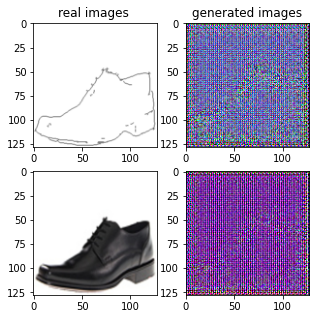

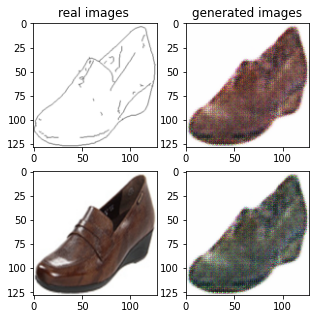

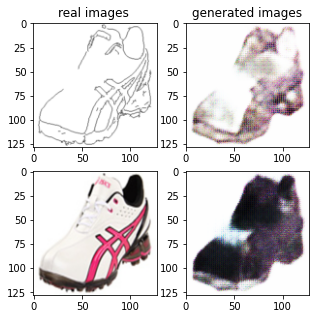

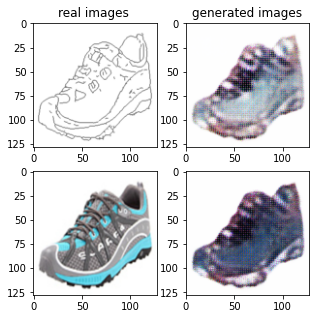

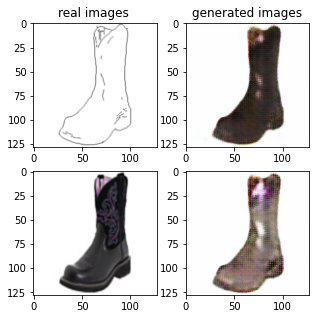

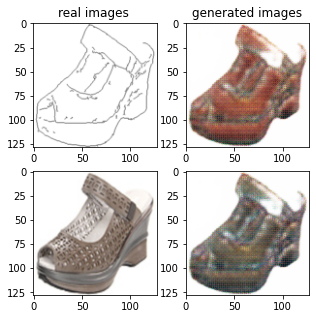

Epoch: 0
Generator Loss= 2.95122178431151
Encoder Loss= 11.072638769650737
VAEGAN Loss= 1.0170689553602197
cLR-GAN Loss= 1.0239186162498675
VAE + CLR Gen Loss= 1.1754170786024067
L1 latent Loss= 0.36290414886483885
L1 image Loss= 0.1668707357364406
KLD loss= 10.70973462884528


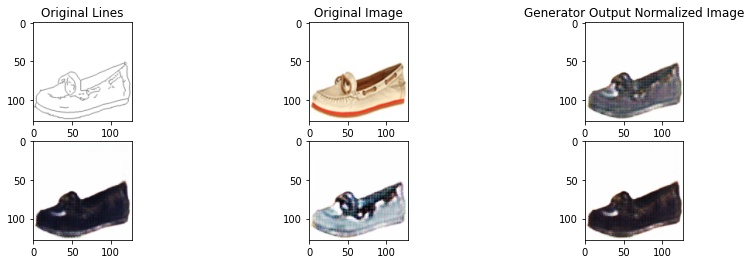

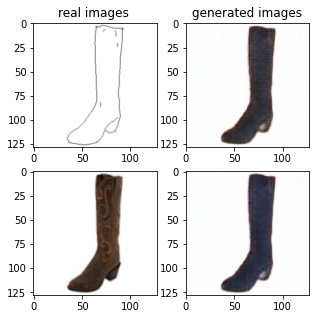

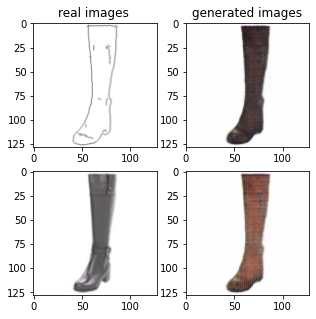

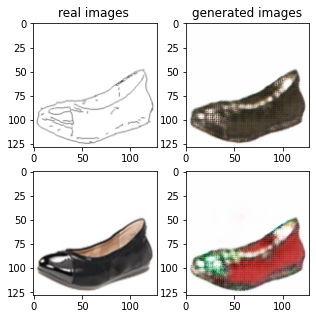

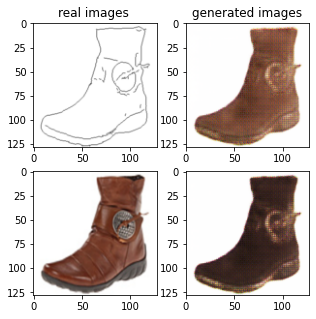

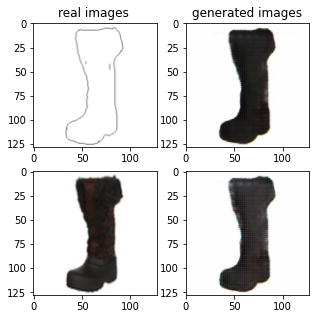

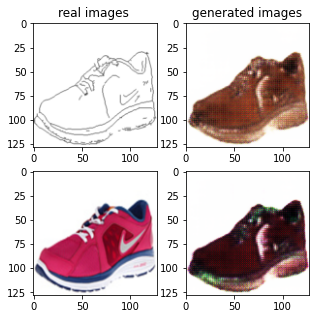

Epoch: 1
Generator Loss= 2.5835297775639634
Encoder Loss= 11.906603043738043
VAEGAN Loss= 0.9819026767047927
cLR-GAN Loss= 1.0171912042547293
VAE + CLR Gen Loss= 1.1798723078655362
L1 latent Loss= 0.3560493578358847
L1 image Loss= 0.12881519366852967
KLD loss= 11.550553679002398


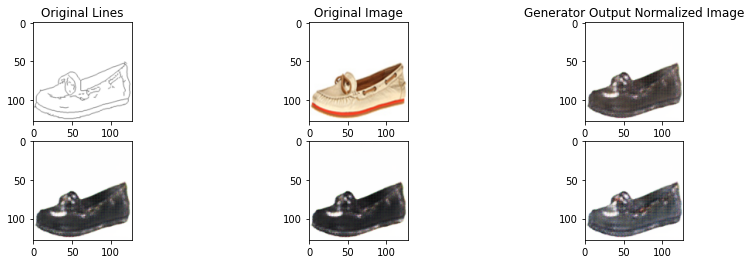

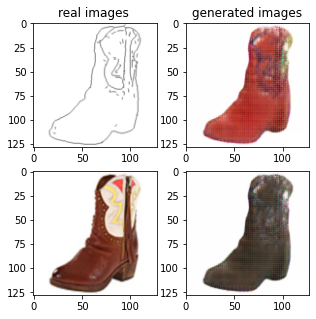

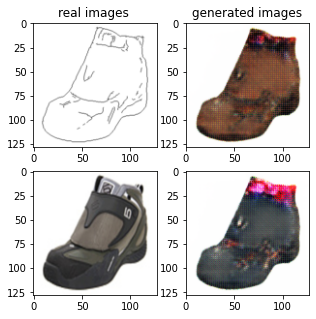

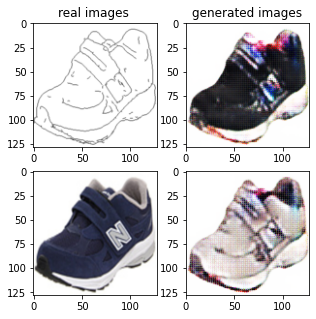

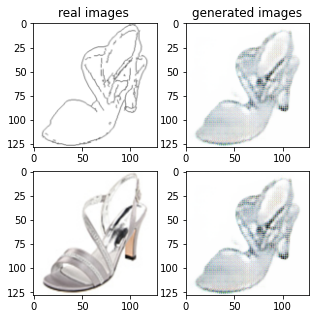

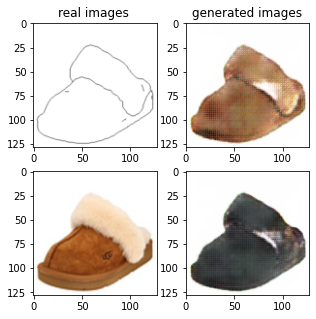

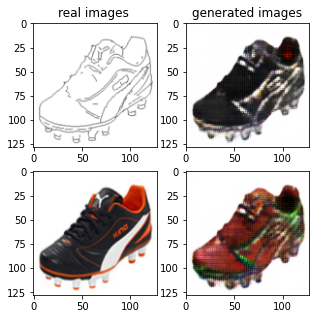

Epoch: 2
Generator Loss= 2.5690686043598308
Encoder Loss= 12.415240795510288
VAEGAN Loss= 0.9569212504398035
cLR-GAN Loss= 1.011275874431959
VAE + CLR Gen Loss= 1.205877701190195
L1 latent Loss= 0.35189428887826457
L1 image Loss= 0.12425574412141792
KLD loss= 12.063346494311025


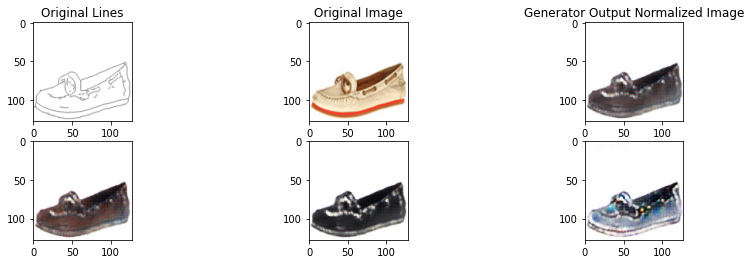

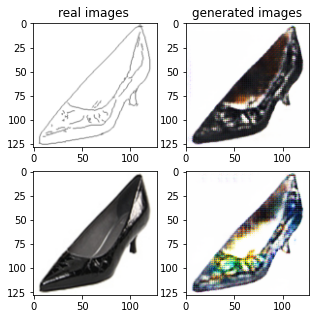

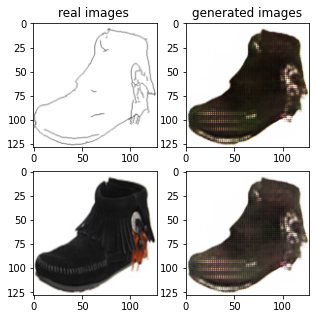

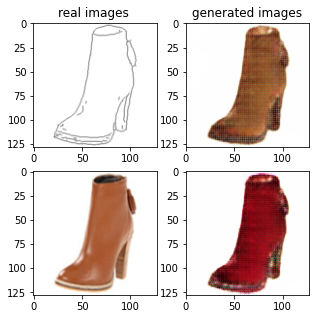

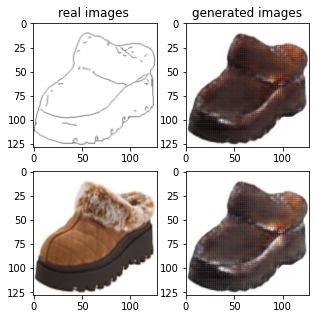

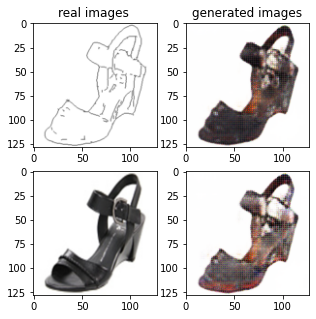

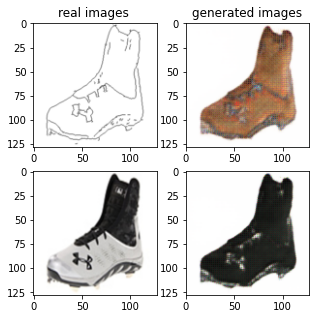

Epoch: 3
Generator Loss= 2.516210214451593
Encoder Loss= 12.558320510433806
VAEGAN Loss= 0.9601242227429082
cLR-GAN Loss= 1.0101381569984822
VAE + CLR Gen Loss= 1.1958587957147495
L1 latent Loss= 0.35046760069952865
L1 image Loss= 0.11982728879507414
KLD loss= 12.207852914268404


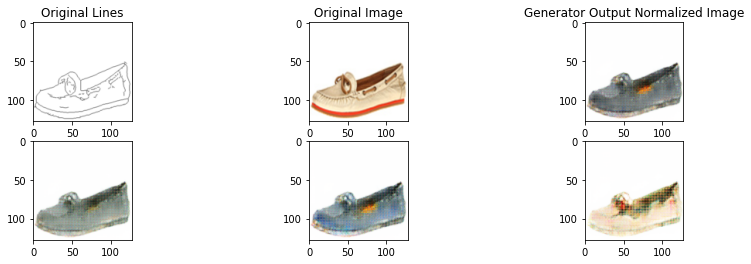

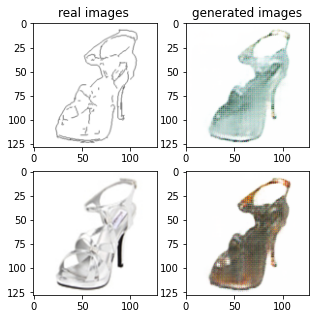

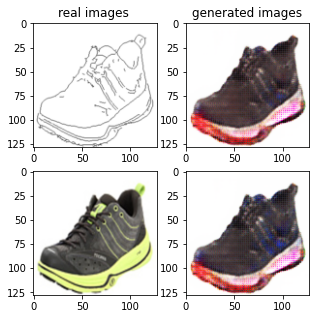

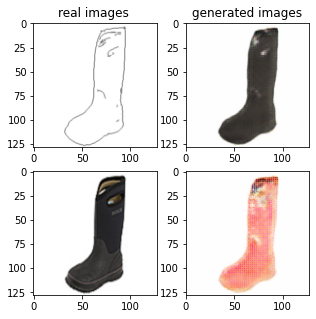

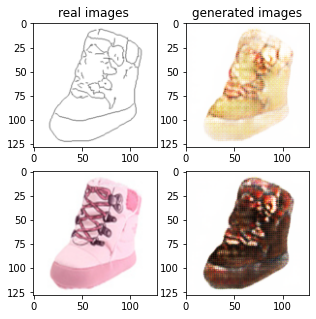

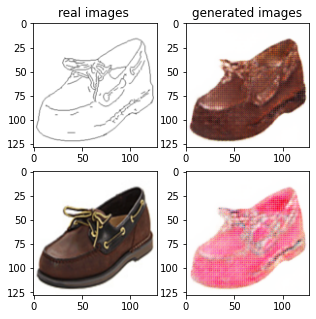

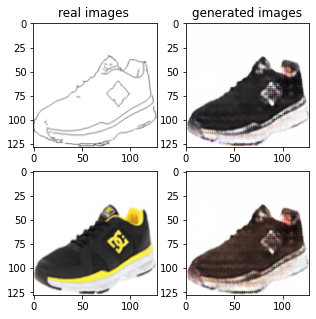

Epoch: 4
Generator Loss= 2.504639847269318
Encoder Loss= 12.454736711079045
VAEGAN Loss= 0.9495573907742705
cLR-GAN Loss= 1.0074027033399515
VAE + CLR Gen Loss= 1.210214586712507
L1 latent Loss= 0.3487329623056757
L1 image Loss= 0.11733652261241632
KLD loss= 12.106003743386918


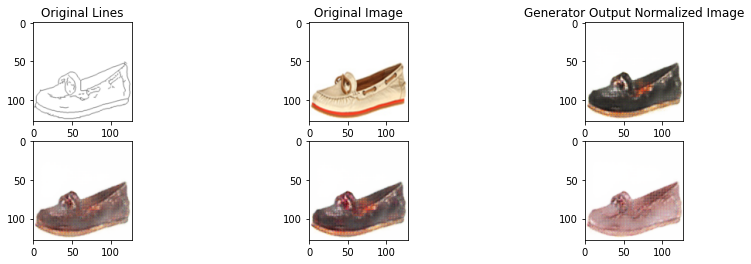

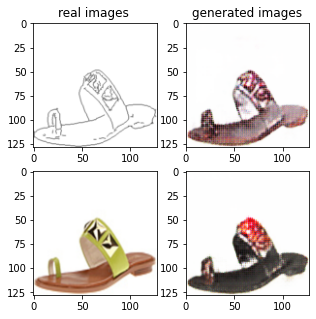

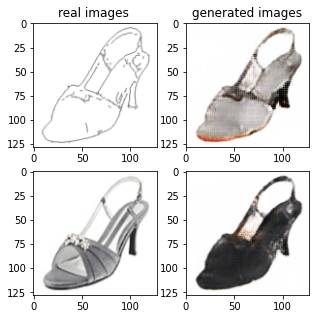

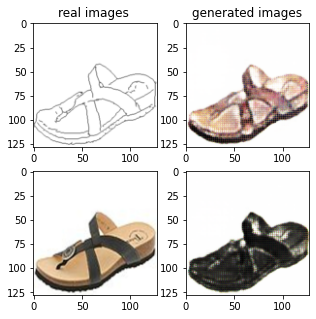

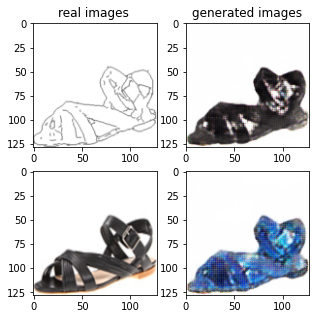

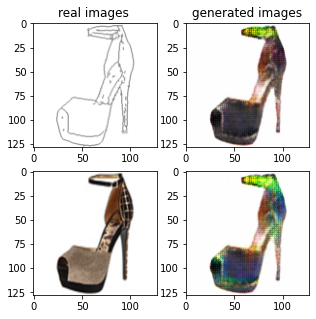

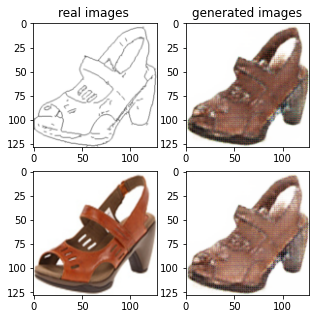

Epoch: 5
Generator Loss= 2.462991902290151
Encoder Loss= 12.607882973748886
VAEGAN Loss= 0.9539318350966338
cLR-GAN Loss= 1.0043759000904364
VAE + CLR Gen Loss= 1.1999872131570304
L1 latent Loss= 0.34735077440390794
L1 image Loss= 0.11403993633702571
KLD loss= 12.260532199918991


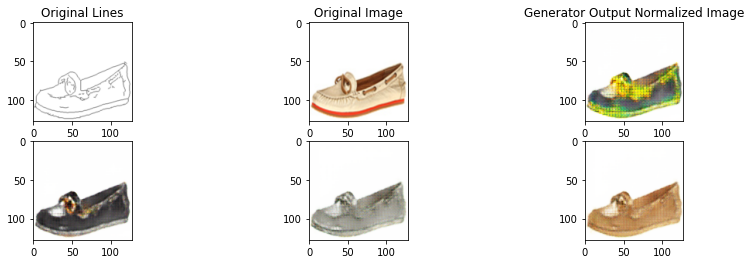

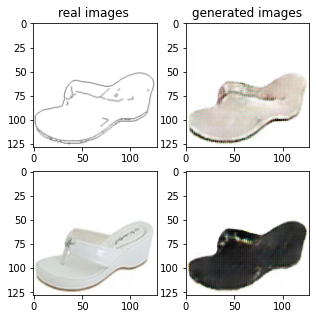

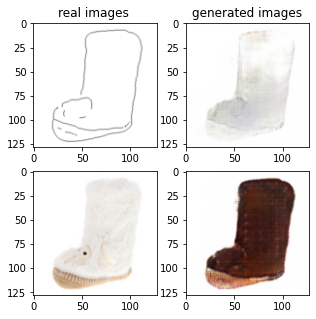

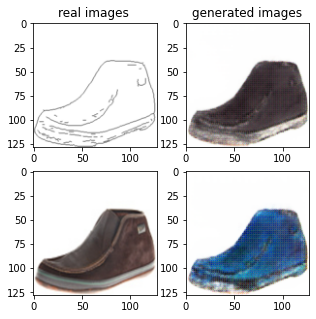

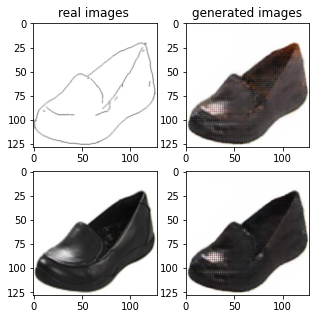

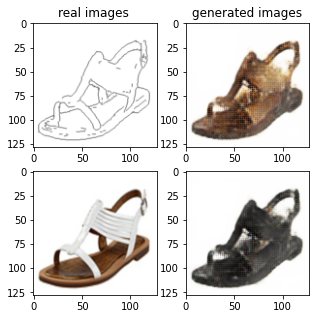

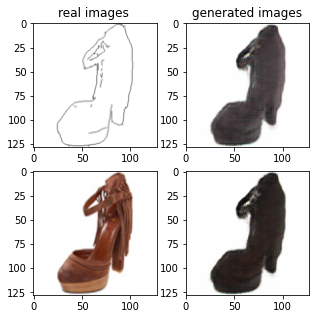

Epoch: 6
Generator Loss= 2.433483951518508
Encoder Loss= 12.595450919796985
VAEGAN Loss= 0.95496842142209
cLR-GAN Loss= 1.002589748109825
VAE + CLR Gen Loss= 1.1962309696099174
L1 latent Loss= 0.34681454796619454
L1 image Loss= 0.11147666212736633
KLD loss= 12.248636373378888


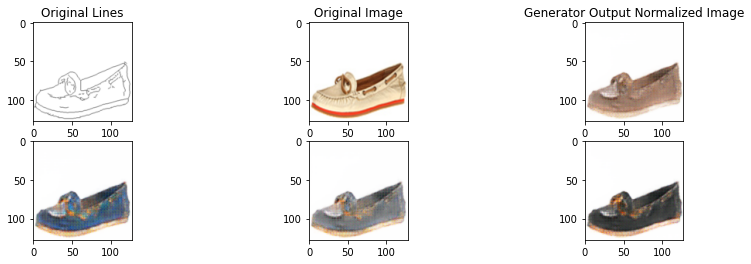

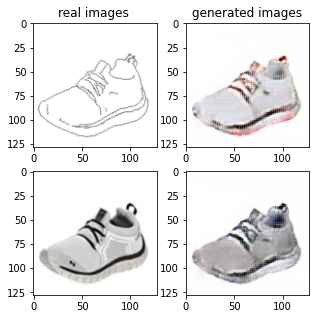

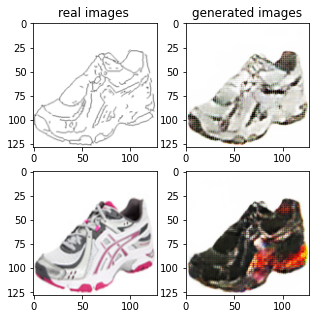

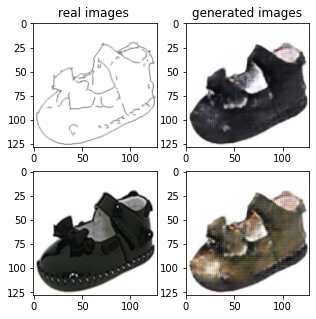

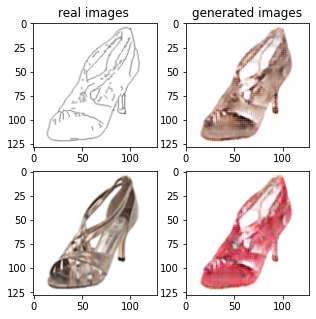

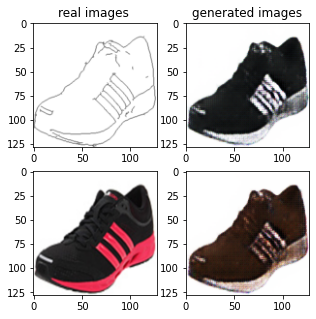

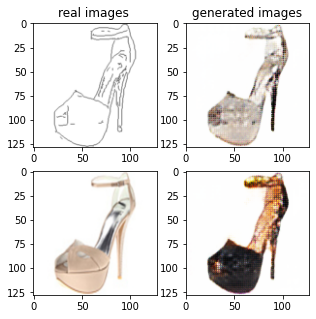

Epoch: 7
Generator Loss= 2.403371631032298
Encoder Loss= 12.475955852367536
VAEGAN Loss= 0.9544922472206071
cLR-GAN Loss= 1.0037642818248689
VAE + CLR Gen Loss= 1.1908048625933985
L1 latent Loss= 0.3465677711228452
L1 image Loss= 0.10912728885239432
KLD loss= 12.129388086897853


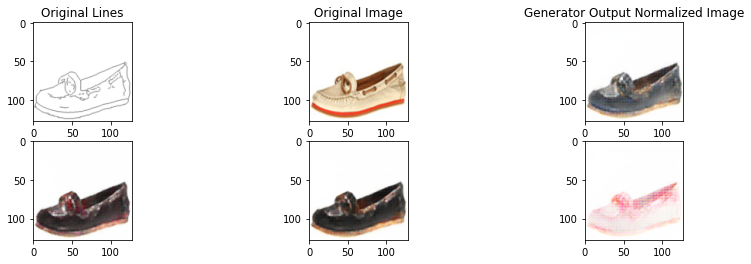

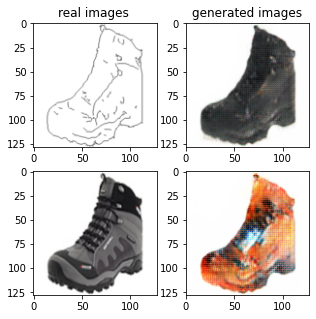

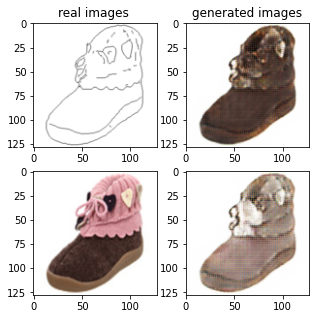

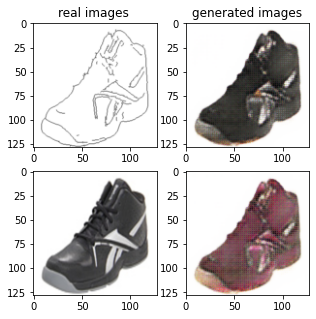

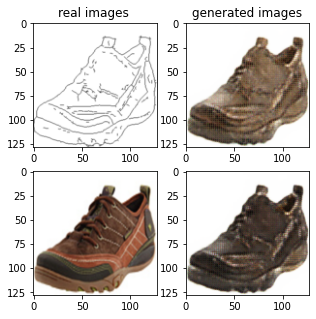

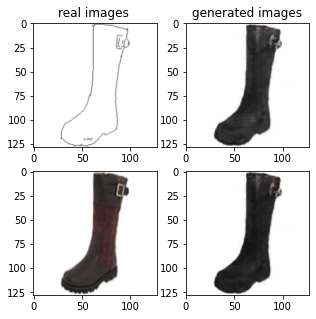

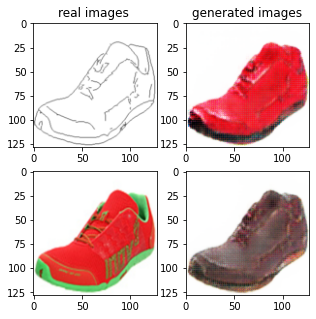

Epoch: 8
Generator Loss= 2.3724302915283677
Encoder Loss= 12.752118395460254
VAEGAN Loss= 0.9586181911976884
cLR-GAN Loss= 1.003820959046657
VAE + CLR Gen Loss= 1.1822650091657378
L1 latent Loss= 0.34551647268380636
L1 image Loss= 0.10660992599154029
KLD loss= 12.406601929942921


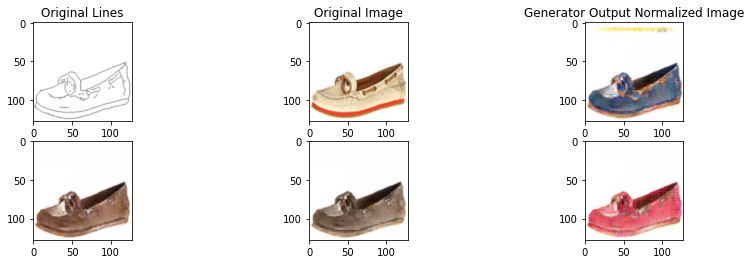

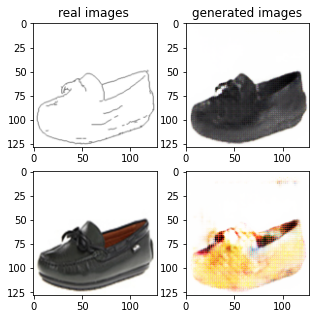

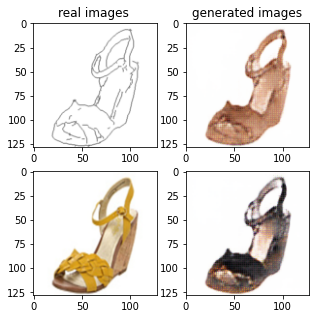

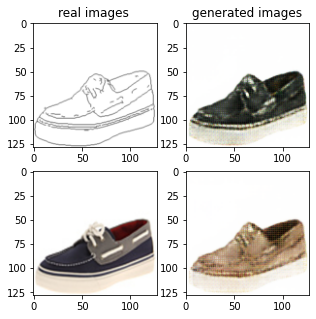

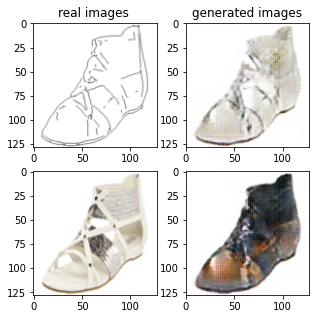

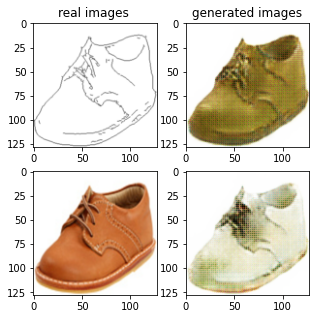

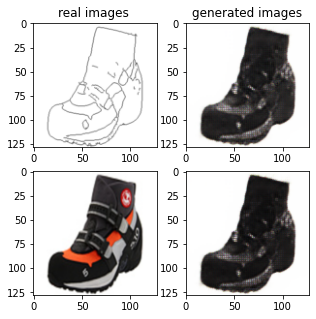

Epoch: 9
Generator Loss= 2.3678145843721086
Encoder Loss= 12.554209643857488
VAEGAN Loss= 0.9548382221956662
cLR-GAN Loss= 0.9993454578321731
VAE + CLR Gen Loss= 1.1945469390093584
L1 latent Loss= 0.3453287634810121
L1 image Loss= 0.10511788358687195
KLD loss= 12.208880881112837


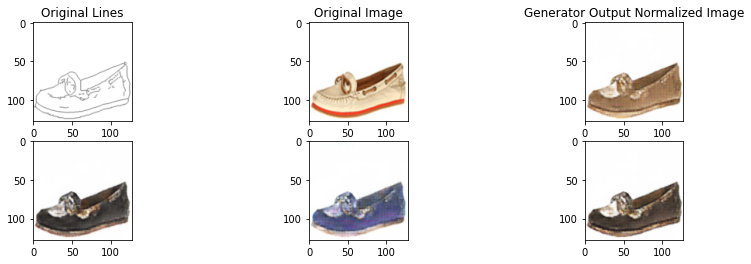

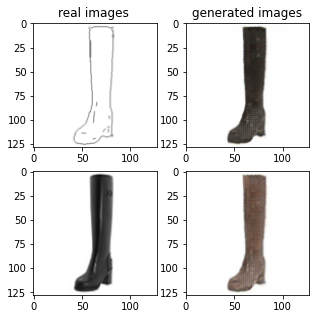

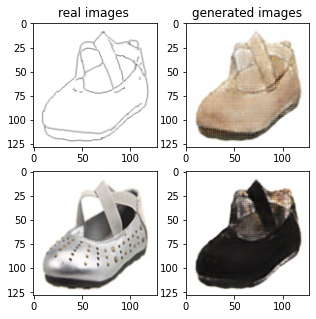

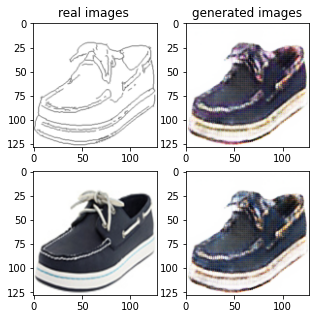

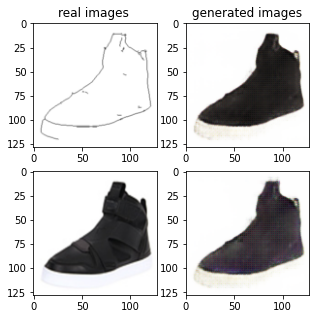

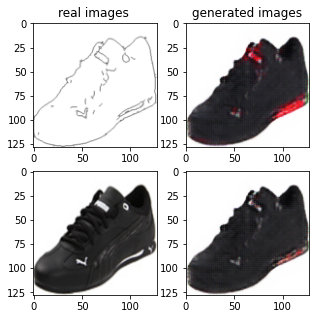

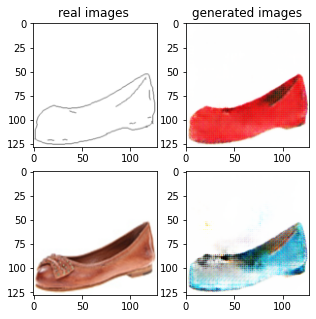

Epoch: 10
Generator Loss= 2.366679238901992
Encoder Loss= 12.618011453457843
VAEGAN Loss= 0.9479652146305092
cLR-GAN Loss= 0.9950114140250803
VAE + CLR Gen Loss= 1.2074223982452883
L1 latent Loss= 0.34497338532821675
L1 image Loss= 0.10365264638968479
KLD loss= 12.273038065572656


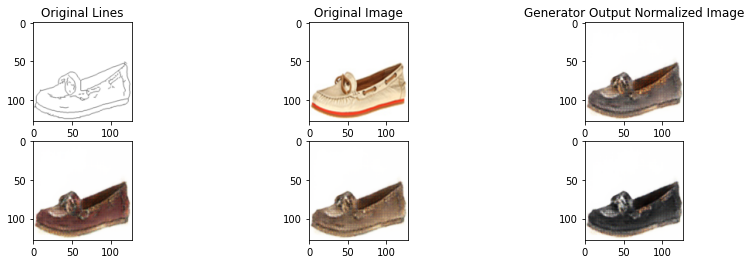

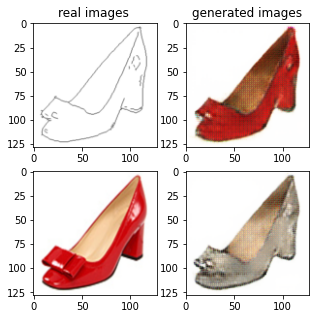

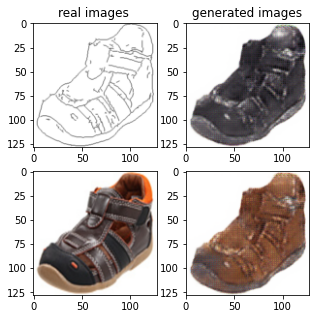

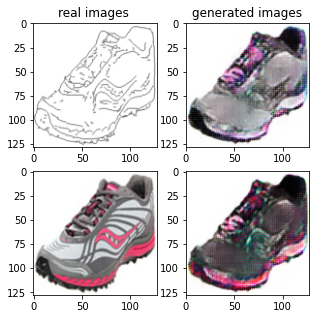

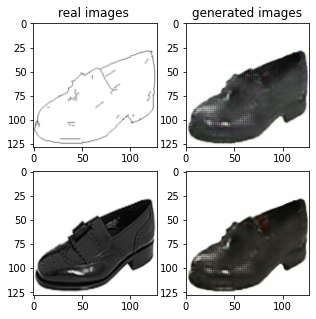

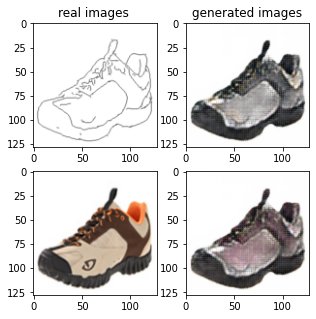

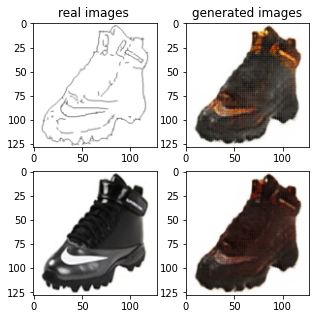

Epoch: 11
Generator Loss= 2.370105719241651
Encoder Loss= 12.781166322036476
VAEGAN Loss= 0.9363427386905433
cLR-GAN Loss= 0.989824852150238
VAE + CLR Gen Loss= 1.2241280476638778
L1 latent Loss= 0.3442577945351137
L1 image Loss= 0.10216085850351747
KLD loss= 12.436908526086622


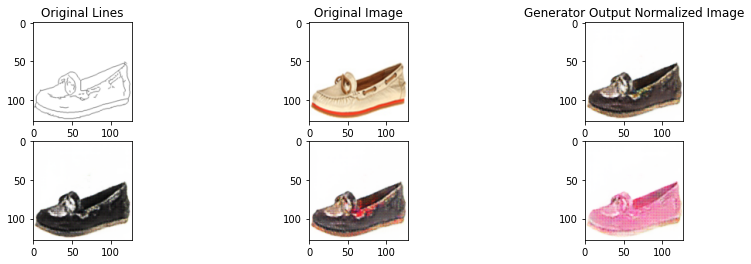

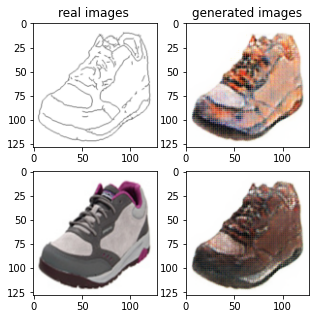

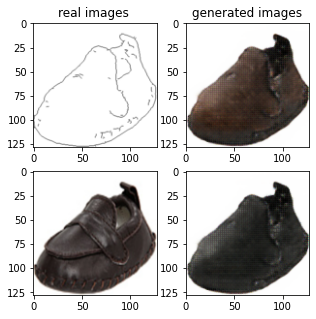

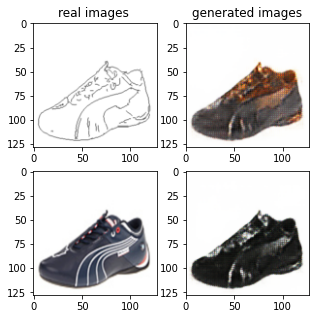

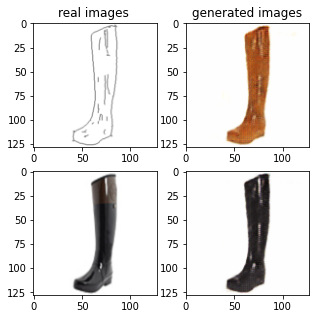

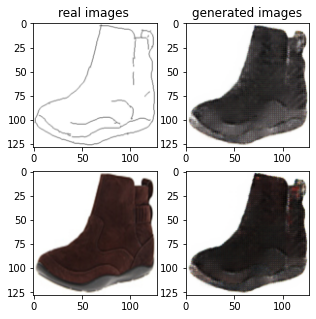

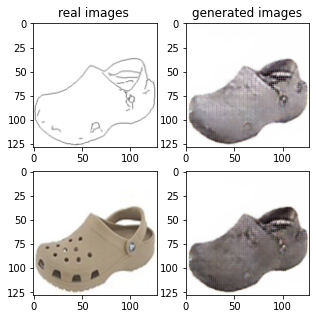

Epoch: 12
Generator Loss= 2.382408092133266
Encoder Loss= 12.660511247100533
VAEGAN Loss= 0.9308436879851939
cLR-GAN Loss= 0.9839693875164374
VAE + CLR Gen Loss= 1.2424267044559063
L1 latent Loss= 0.3455849502279137
L1 image Loss= 0.10168321209484965
KLD loss= 12.314926295521659


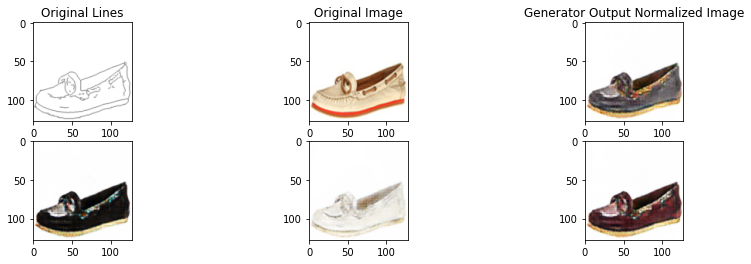

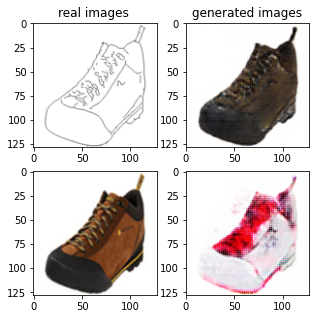

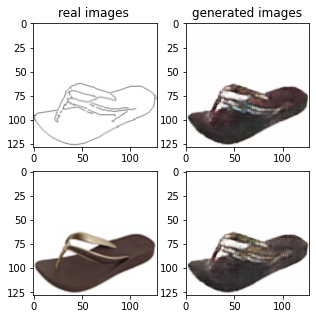

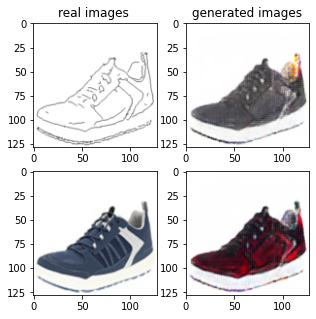

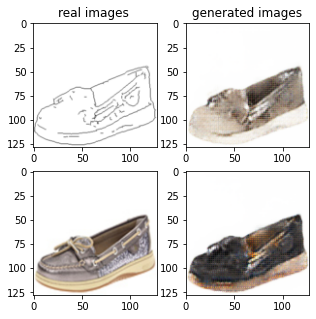

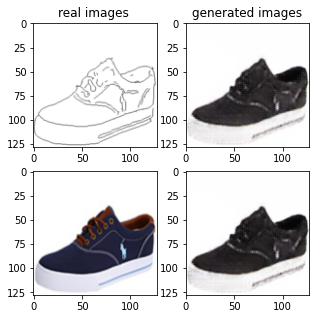

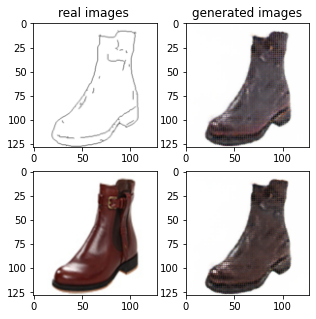

Epoch: 13
Generator Loss= 2.3884925008283977
Encoder Loss= 12.571063881718231
VAEGAN Loss= 0.9214061741699041
cLR-GAN Loss= 0.9781165343082369
VAE + CLR Gen Loss= 1.2607548983760382
L1 latent Loss= 0.3460044977555943
L1 image Loss= 0.10054870077666142
KLD loss= 12.225059388305427


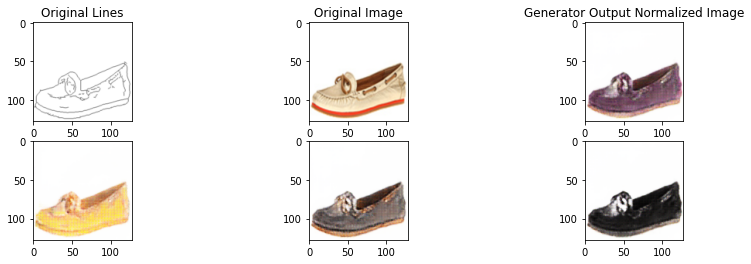

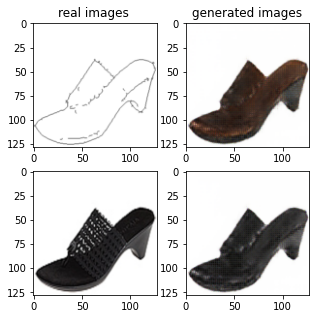

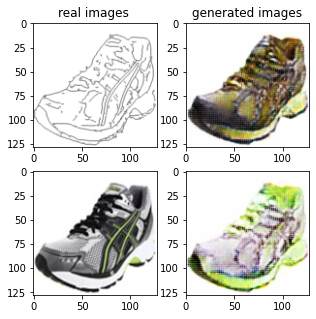

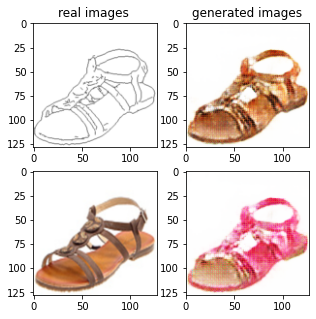

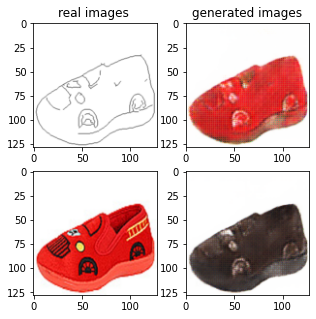

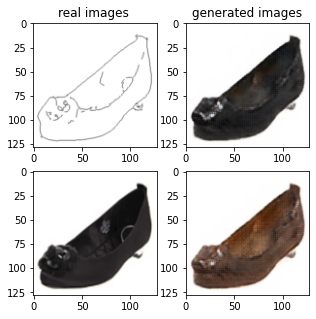

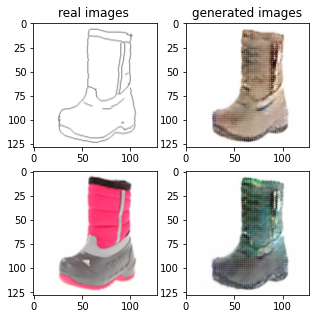

Epoch: 14
Generator Loss= 2.4132663131687893
Encoder Loss= 12.37771131287289
VAEGAN Loss= 0.9055531664813075
cLR-GAN Loss= 0.9689397907210695
VAE + CLR Gen Loss= 1.2918831164966762
L1 latent Loss= 0.34574239146152824
L1 image Loss= 0.100106350700679
KLD loss= 12.031968923579859


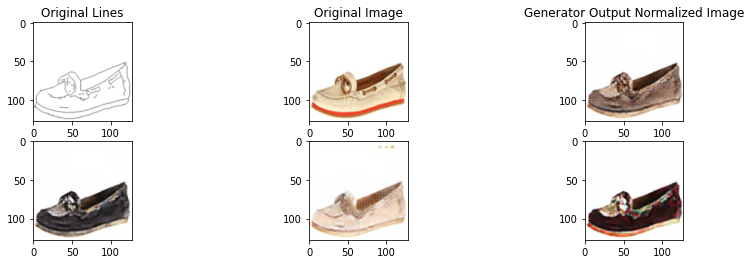

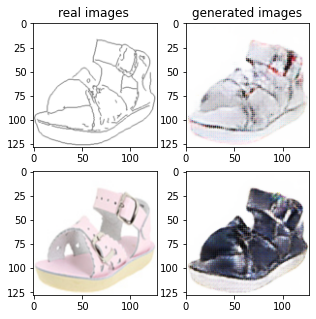

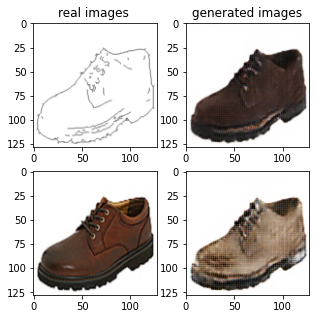

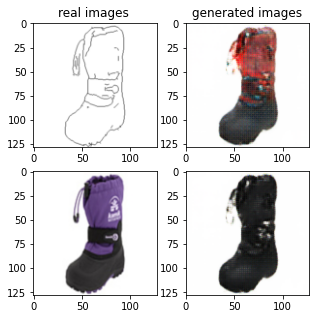

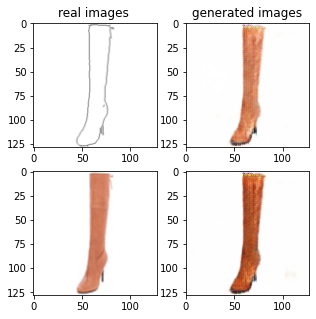

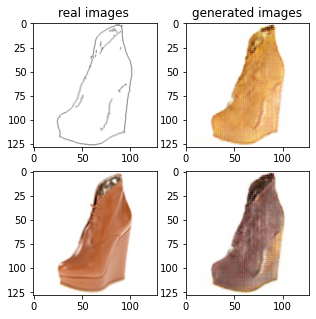

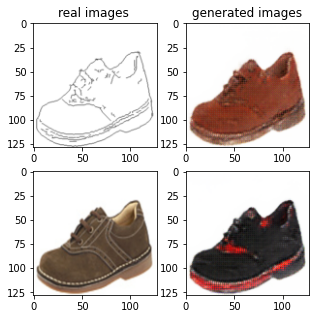

Epoch: 15
Generator Loss= 2.4340401510784133
Encoder Loss= 12.794913811999072
VAEGAN Loss= 0.8938789323378166
cLR-GAN Loss= 0.9623441814912432
VAE + CLR Gen Loss= 1.3148066541796064
L1 latent Loss= 0.3463743399669224
L1 image Loss= 0.09947481024213106
KLD loss= 12.448539463740842


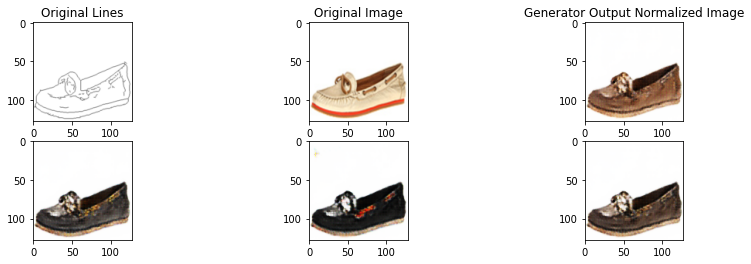

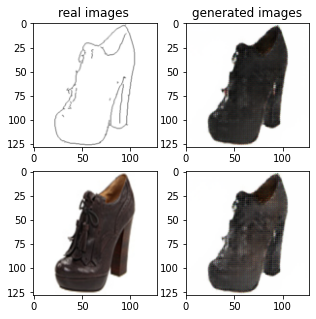

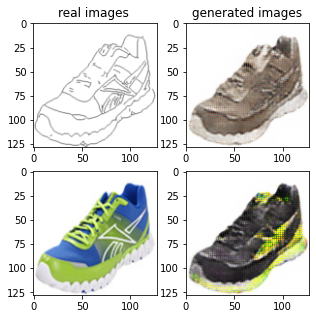

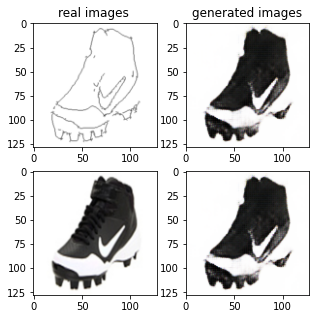

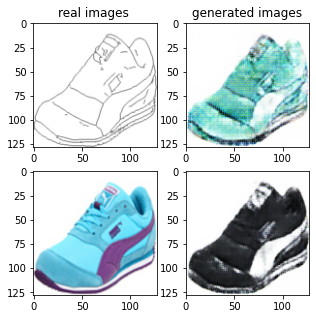

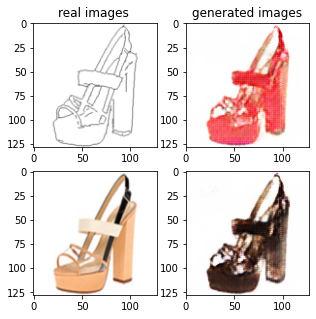

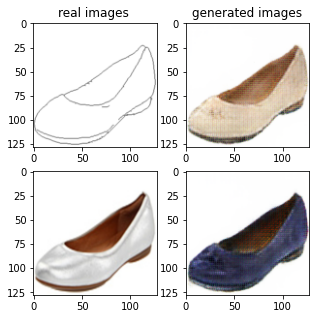

Epoch: 16
Generator Loss= 2.4625025790952986
Encoder Loss= 12.741717679955153
VAEGAN Loss= 0.8806865382519213
cLR-GAN Loss= 0.952053883497817
VAE + CLR Gen Loss= 1.346266217639938
L1 latent Loss= 0.3451916839883949
L1 image Loss= 0.09922711007615935
KLD loss= 12.396525990267207


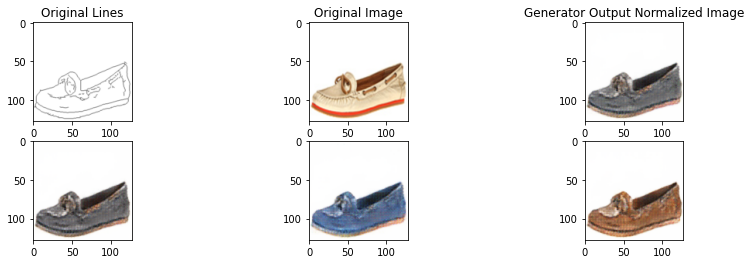

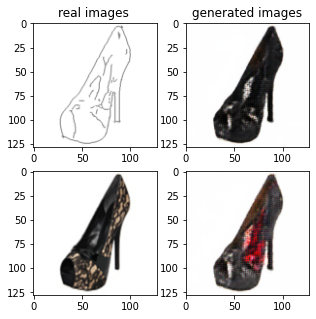

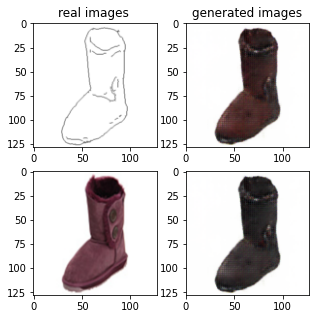

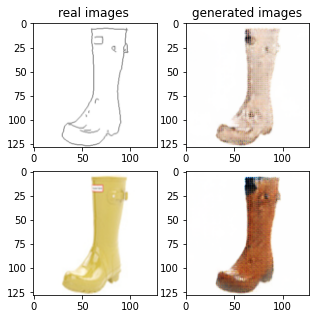

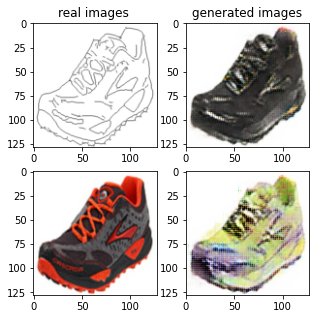

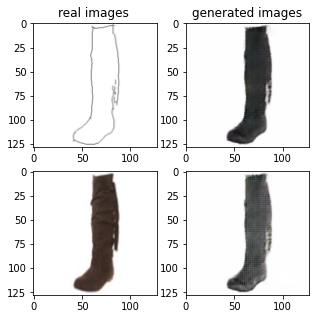

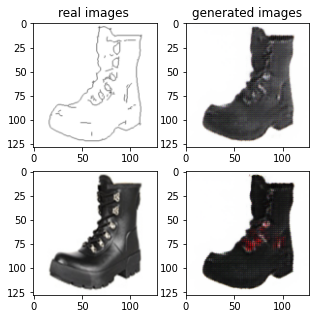

Epoch: 17
Generator Loss= 2.505623353501702
Encoder Loss= 12.411779775879262
VAEGAN Loss= 0.8583981502032929
cLR-GAN Loss= 0.9393045362795374
VAE + CLR Gen Loss= 1.3881267855139559
L1 latent Loss= 0.3459422577737834
L1 image Loss= 0.09968381934447743
KLD loss= 12.065837521682917


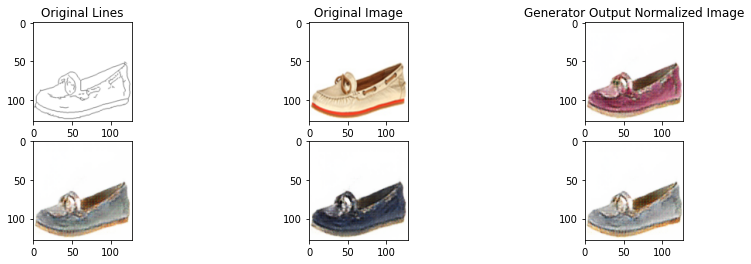

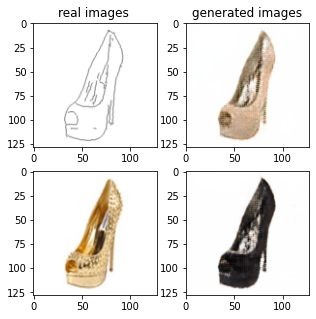

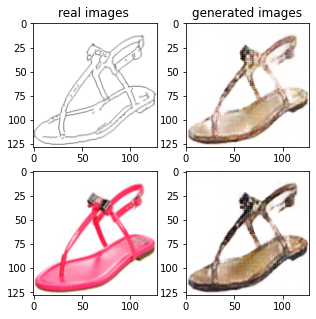

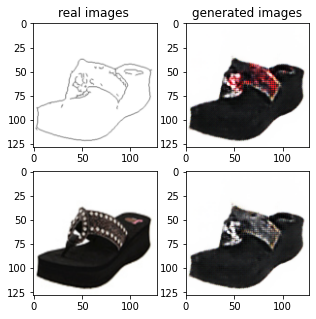

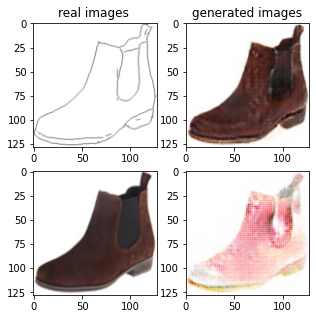

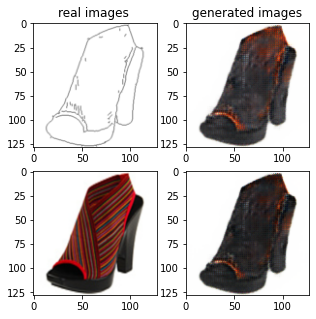

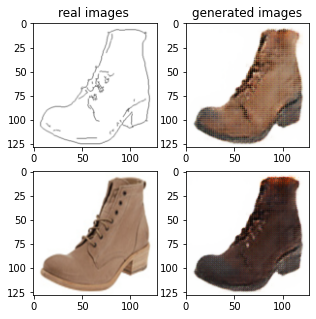

Epoch: 18
Generator Loss= 2.5385137709662144
Encoder Loss= 12.587768027940148
VAEGAN Loss= 0.8397696687089794
cLR-GAN Loss= 0.92661954164505
VAE + CLR Gen Loss= 1.4278369784819014
L1 latent Loss= 0.34764889942532845
L1 image Loss= 0.09882756031991674
KLD loss= 12.240119134034629


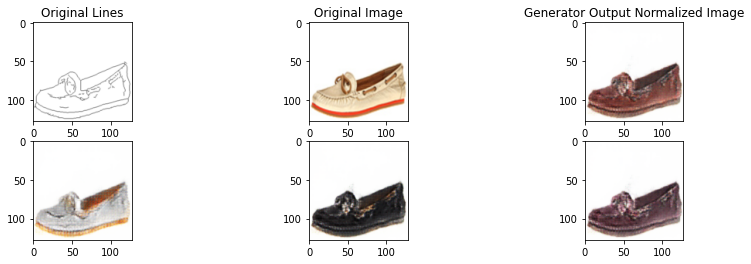

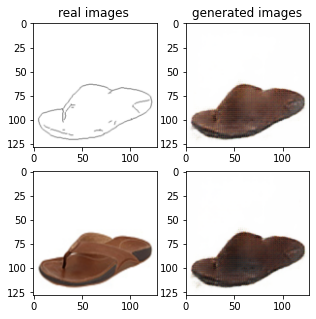

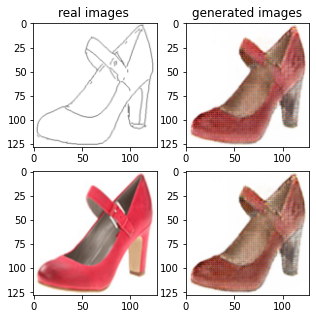

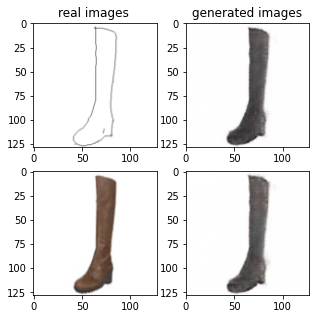

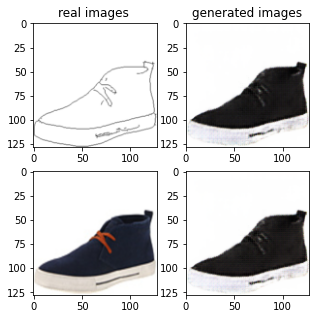

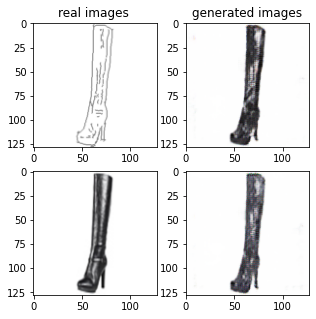

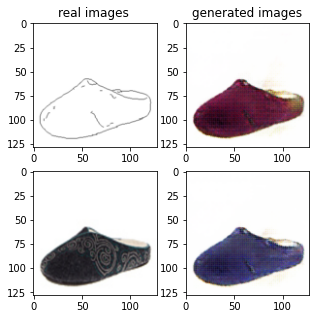

Epoch: 19
Generator Loss= 2.592515149979276
Encoder Loss= 12.659551400897104
VAEGAN Loss= 0.8180775105489367
cLR-GAN Loss= 0.9102939125396862
VAE + CLR Gen Loss= 1.475486730647922
L1 latent Loss= 0.34771042294539367
L1 image Loss= 0.09939100104547197
KLD loss= 12.311840970785237


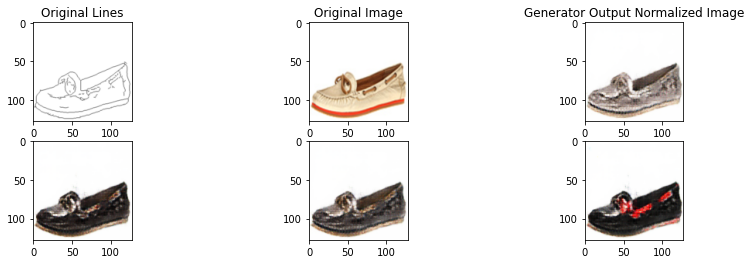

In [ ]:
import matplotlib.pyplot as plt

# Training
total_steps = len(loader)*num_epochs; step = 0
# 
encoder_loss_list=[]
generator_loss_list=[]
vaegan_loss_list=[]
clrgan_loss_list=[]


input_image0 = loader.dataset[0][0]
input_image0 = torch.unsqueeze(input_image0, 0).to(gpu_id)
input_image1 = loader.dataset[0][1]
input_image1 = torch.unsqueeze(input_image1, 0).to(gpu_id)

for e in range(num_epochs):
	start = time.time()
	current_epoch_vaeclrgan_loss=[]
	current_epoch_encoder_loss = []
	current_epoch_gen_loss = []
	current_epoch_latentl1=[]
	current_epoch_l1image=[]
	current_epoch_kld=[]
	current_epoch_vaegan_loss=[]
	current_epoch_clrgan_loss=[]
	for idx, data in enumerate(loader):

		########## Process Inputs ##########
		# optimizer_E.zero_grad()
		# optimizer_G.zero_grad()
		edge_tensor, rgb_tensor = data
		edge_tensor, rgb_tensor = norm(edge_tensor).to(gpu_id), norm(rgb_tensor).to(gpu_id)
		real_A = edge_tensor; real_B = rgb_tensor;
		
		# valid = Variable(Tensor(np.ones((real_A.shape[0],1,latent_dim, latent_dim))), requires_grad=False)
		# fake = Variable(Tensor(np.zeros((real_A.shape[0],1,latent_dim, latent_dim))), requires_grad=False)
		if real_A.shape[0] == 2:
			real_A_vae = real_A[0].unsqueeze(0)
			real_A_clr = real_A[1].unsqueeze(0)
			real_B_vae = real_B[0].unsqueeze(0)
			real_B_clr = real_B[1].unsqueeze(0)
		else:
			real_A_vae = real_A
			real_A_clr = real_A
			real_B_vae = real_B
			real_B_clr = real_B

		#-------------------------------
		#  Forward Passes
		#------------------------------
		encoder.train()
		generator.train()

		# cVAE_GAN : B -> z -> B_hat
		mu_real, logvar_real = encoder(real_B)
		z_real = reparameterization(mu_real, logvar_real, gpu_id)
		fake_B_fromreal = generator(real_A, z_real)

		# cLR_GAN : z-> B -> z_hat
		z_random = torch.randn(real_A.shape[0], latent_dim).to(gpu_id)
		fake_B_random = generator(real_A, z_random)
		z_mu_reconstructed, z_logvar_reconstructed = encoder(fake_B_random)
	
		#-------------------------------
		#  Train Generator and Encoder
		#------------------------------

		optimizer_G.zero_grad()
		optimizer_E.zero_grad()
	
		for param in discriminator_vae.parameters():
			param.requires_grad = False
		
		for param in discriminator_clr.parameters():
			param.requires_grad = False


		l1_loss_img = L1(fake_B_fromreal, real_B)
		current_epoch_l1image.append(l1_loss_img.detach().cpu().item())
	
		loss_en_kld = calc_kld(mu_real,logvar_real)
		current_epoch_kld.append(loss_en_kld.cpu().item())
	
		fake_B_fromreal_lab1, fake_B_fromreal_lab2 = discriminator_vae(fake_B_fromreal)
		vaegen_loss = mse_loss(fake_B_fromreal_lab1, valid) + mse_loss(fake_B_fromreal_lab2, valid) 
	
		fake_B_random_label1, fake_B_random_label2 = discriminator_clr(fake_B_random)
		clrgen_loss = mse_loss(fake_B_random_label1, valid) + mse_loss(fake_B_random_label2, valid)
	
		current_epoch_vaeclrgan_loss.append((vaegen_loss+clrgen_loss).detach().cpu().item())
	
		GE_loss = vaegen_loss + clrgen_loss + lambda_pixel*l1_loss_img + \
		lambda_kl*loss_en_kld
		current_epoch_gen_loss.append(GE_loss.detach().cpu().item())

		# Retain graph true so that you can optimize G seperately, this is 
		# supposed to give better performance by learning better modes according to
		# paper

		GE_loss.backward(retain_graph=True)
	
		for param in encoder.parameters():
			param.requires_grad = False
		
		# Update gradients for only generator
		only_g_loss = lambda_latent*L1(z_mu_reconstructed, z_random)
		current_epoch_latentl1.append(only_g_loss.detach().cpu().item())
		current_epoch_encoder_loss.append((only_g_loss+loss_en_kld).detach().cpu().item())
		only_g_loss.backward()

		for param in encoder.parameters():
			param.requires_grad = True

		optimizer_E.step()
		optimizer_G.step()

		#----------------------------------
		#  Train Discriminator
		#----------------------------------

		optimizer_Dclr.zero_grad()
		optimizer_Dvae.zero_grad()
	
		for param in discriminator_vae.parameters():
			param.requires_grad = True
		
		for param in discriminator_clr.parameters():
			param.requires_grad = True

		# loss signature -> def loss_discriminator(real_B, fake_b, 
		#                                         valid, fake, loss, discriminator):
		# (cVAE-GAN)
		
		cvae_loss = loss_discriminator_multi_patch(real_B, fake_B_fromreal, \
		                              valid, fake, mse_loss, discriminator_vae)
		current_epoch_vaegan_loss.append(cvae_loss.detach().cpu().item())
		cvae_loss.backward()
	
		# (cLR-GAN)
		
		clr_loss = loss_discriminator_multi_patch(real_B, fake_B_random, \
		                              valid, fake, mse_loss, discriminator_clr)
		current_epoch_clrgan_loss.append(clr_loss.detach().cpu().item())
		clr_loss.backward()

		optimizer_Dclr.step()
		optimizer_Dvae.step()
	
		if idx%500 == 0:
			vis_fake_B_encoded = denorm(fake_B_fromreal[0].detach()).cpu().data.numpy().astype(np.uint8)
			vis_fake_B_random = denorm(fake_B_random[0].detach()).cpu().data.numpy().astype(np.uint8)
			vis_real_B = denorm(real_B[0].detach()).cpu().data.numpy().astype(np.uint8)
			vis_real_A = denorm(real_A[0].detach()).cpu().data.numpy().astype(np.uint8)
			fig, axs = plt.subplots(2, 2, figsize=(5, 5))
			axs[0, 0].imshow(vis_real_A.transpose(1, 2, 0))
			axs[0, 0].set_title('real images ')
			axs[0, 1].imshow(vis_fake_B_encoded.transpose(1, 2, 0))
			axs[0, 1].set_title('generated images')
			axs[1, 0].imshow(vis_real_B.transpose(1, 2, 0))
			# axs[1, 0].set_title('real images edges')
			axs[1, 1].imshow(vis_fake_B_random.transpose(1, 2, 0))
			# axs[1, 1].set_title('generated images (random)')
			plt.show()

	
		
		
		
		""" Optional TODO: 
			1. You may want to visualize results during training for debugging purpose
			2. Save your model every few iterations
		"""
	#checkpoint = {'generator': generator.state_dict()}
	#torch.save(checkpoint, 'generator.pt')
	if(e%4==0):
		torch.save(generator.state_dict(),model_dirs+"generator_epoch{}.pth".format(e))
		torch.save(encoder.state_dict(),model_dirs+"encoder_epoch{}.pth".format(e))
		torch.save(discriminator_vae.state_dict(),model_dirs+"discriminator_vae_epoch{}.pth".format(e))
		torch.save(discriminator_clr.state_dict(),model_dirs+"discriminator_clr_epoch{}.pth".format(e))

	generator_loss_list.append(current_epoch_gen_loss)
	encoder_loss_list.append(current_epoch_encoder_loss)
	vaegan_loss_list.append(current_epoch_vaegan_loss)
	clrgan_loss_list.append(current_epoch_clrgan_loss)
	print("Epoch:", e)
	print("Generator Loss=",np.mean(current_epoch_gen_loss))
	print("Encoder Loss=",np.mean(current_epoch_encoder_loss))
	print("VAEGAN Loss=",np.mean(current_epoch_vaegan_loss))
	print("cLR-GAN Loss=",np.mean(current_epoch_clrgan_loss))
	print("VAE + CLR Gen Loss=",np.mean(current_epoch_vaeclrgan_loss))
	print("L1 latent Loss=",np.mean(current_epoch_latentl1))
	print("L1 image Loss=",np.mean(current_epoch_l1image))
	print("KLD loss=",np.mean(current_epoch_kld))
	
	mu_real, logvar_real = encoder(norm(input_image0)) 
	z_real = reparameterization(mu_real, logvar_real)
	fake_images = generator (norm(input_image0),z_real)
 

	# import matplotlib.pyplot as plt
	f = plt.figure()
	f.set_figwidth(14)

	ax1 =plt.subplot(2,3,1)
	ax1.set_title("Original Lines")
	plt.imshow(input_image0[0].detach().cpu().data.numpy().astype(np.uint8).transpose(1, 2, 0))
 
	ax2 =plt.subplot(2,3,2)
	ax2.set_title("Original Image")
	plt.imshow(input_image1[0].detach().cpu().data.numpy().astype(np.uint8).transpose(1, 2, 0))
	
 
	ax3 =plt.subplot(2,3,3)
	ax3.set_title("Generator Output Normalized Image")
	plt.imshow( denorm(fake_images[0].detach()).cpu().data.numpy().astype(np.uint8).transpose(1, 2, 0))
	#plt.tight_layout()
 
	# f = plt.figure()
	for i in range(3):
		z_real = torch.normal(mean = torch.zeros([1,8]).to(gpu_id),std = torch.ones([1,8]).to(gpu_id))
		fake_images = generator (norm(input_image0),z_real)
		
		ax = plt.subplot(2,3,i+4)
		#ax.set_title("Additional Generated Results")
		plt.imshow(denorm(fake_images[0].detach()).cpu().data.numpy().astype(np.uint8).transpose(1, 2, 0))
	plt.savefig(plots_dirs+"genimages_epoch{}".format(e))
	plt.show()
	# plt.savefig(plots_dirs+"genimages2disc2patch_epoch{}".format(e))

np.save(losses_dirs+"generator_loss.npy", np.array(generator_loss_list))
np.save(losses_dirs+"encoder_loss.npy", np.array(encoder_loss_list))
np.save(losses_dirs+"vae_gan_loss.npy", np.array(vaegan_loss_list))
np.save(losses_dirs+"clr_gan_loss.npy", np.array(clrgan_loss_list))
torch.save(generator.state_dict(),model_dirs+"generator{}.pth".format(e))
torch.save(encoder.state_dict(),model_dirs+"encoder{}.pth".format(e))
torch.save(discriminator_vae.state_dict(),model_dirs+"discriminator_vae_epoch{}.pth".format(e))
torch.save(discriminator_clr.state_dict(),model_dirs+"discriminator_clr_epoch{}.pth".format(e))

# Loss Plots

In [ ]:
v = "BGANS_Edge2Shoe_2disc_2patch"
generator_loss_list=np.load(losses_dirs+v+"generator_loss.npy")
encoder_loss_list=np.load(losses_dirs+v+"encoder_loss.npy")
vaegan_loss_list=np.load(losses_dirs+v+"vae_gan_loss.npy")
clrgan_loss_list=np.load(losses_dirs+v+"clr_gan_loss.npy")

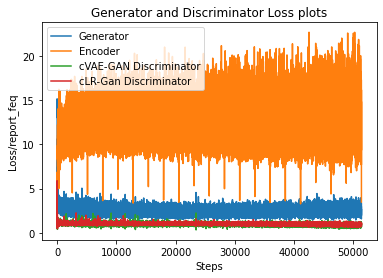

In [ ]:
import matplotlib.pyplot as plt
plt.figure()
plt.plot(np.array(generator_loss_list).flatten(), label='Generator')
plt.plot(np.array(encoder_loss_list).flatten(), label='Encoder')
plt.plot(np.array(vaegan_loss_list).flatten(), label='cVAE-GAN Discriminator')
plt.plot(np.array(clrgan_loss_list).flatten(), label='cLR-Gan Discriminator')
plt.title('Generator and Discriminator Loss plots')
plt.xlabel('Steps')
plt.ylabel('Loss/report_feq')
plt.legend()
plt.show()

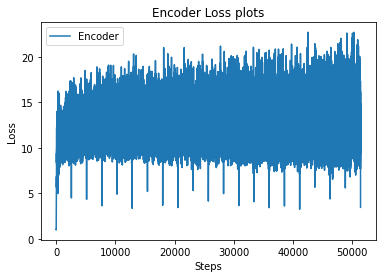

In [ ]:
import matplotlib.pyplot as plt
plt.figure()

plt.plot(np.array(encoder_loss_list).flatten(), label='Encoder')
plt.title('Encoder Loss plots')
plt.xlabel('Steps')
plt.ylabel('Loss')
plt.legend()
plt.show()

#Qualitative Visualisation

In [ ]:
generator = Generator(latent_dim, img_shape).to(gpu_id)
encoder = Encoder(latent_dim).to(gpu_id)

discriminator_clr = Discriminator().to(gpu_id)
discriminator_vae = Discriminator().to(gpu_id)
e = 19
v = "BGANS_Edge2Shoe_2disc_2patch"
generator.load_state_dict(torch.load(model_dirs+v+"generator{}.pth".format(e)))
encoder.load_state_dict(torch.load(model_dirs+v+"encoder{}.pth".format(e)))
discriminator_vae.load_state_dict(torch.load(model_dirs+v+"discriminator_vae_epoch{}.pth".format(e)))
discriminator_clr.load_state_dict(torch.load(model_dirs+v+"discriminator_clr_epoch{}.pth".format(e)))

<All keys matched successfully>

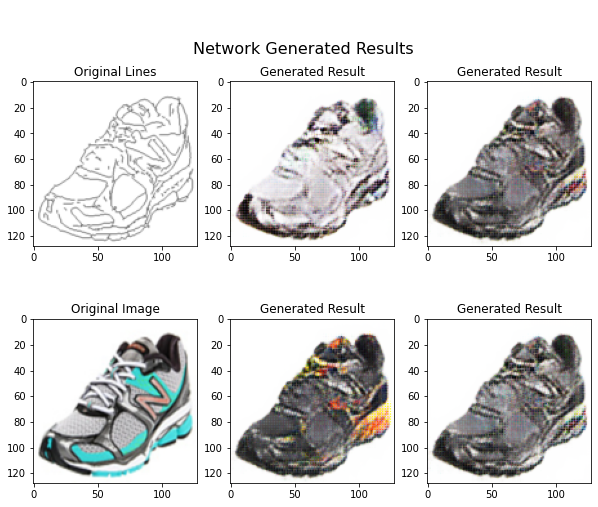

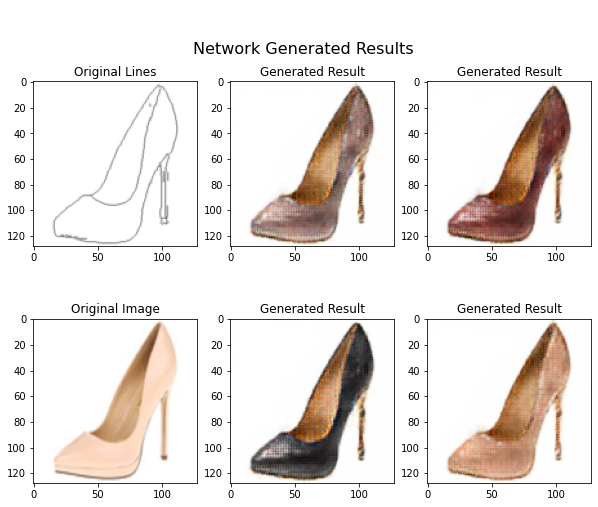

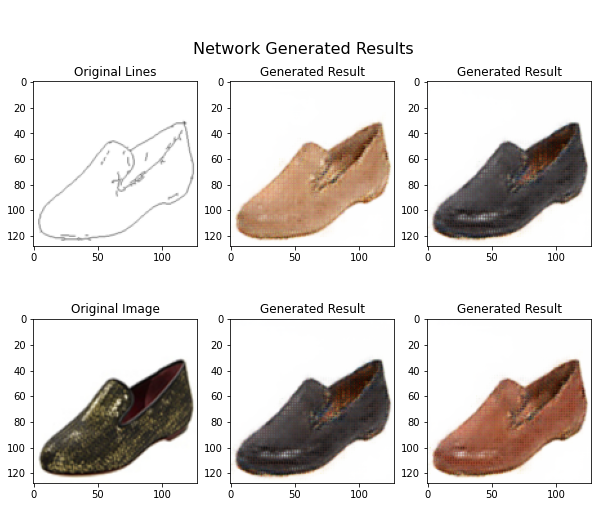

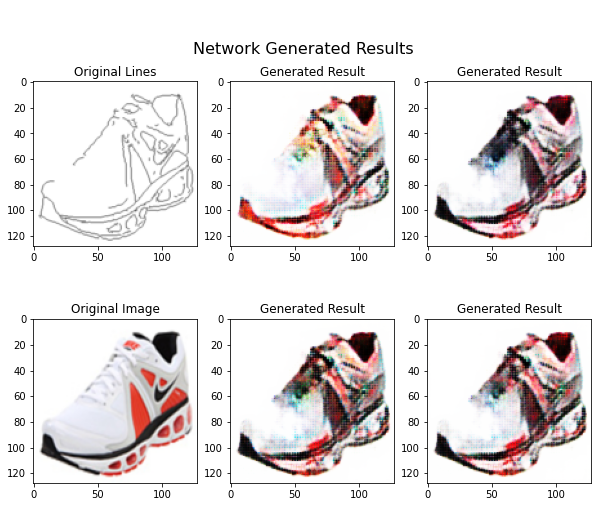

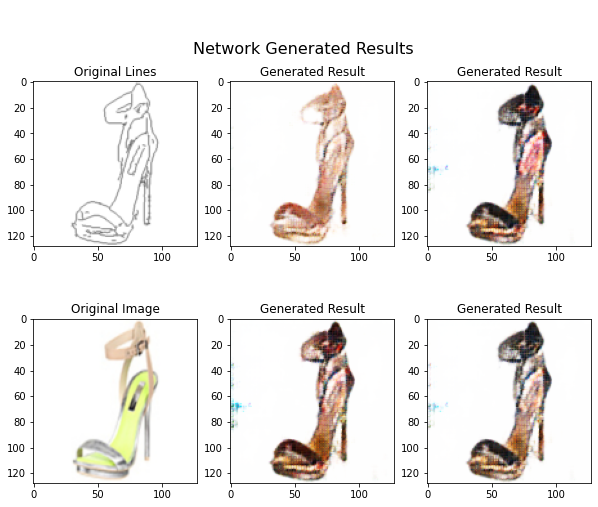

...

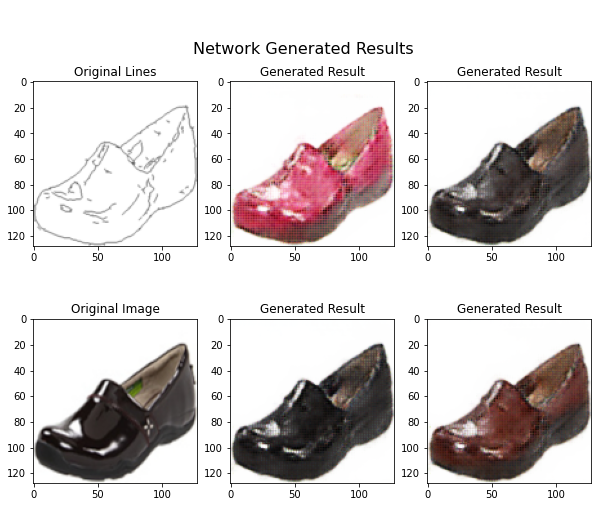

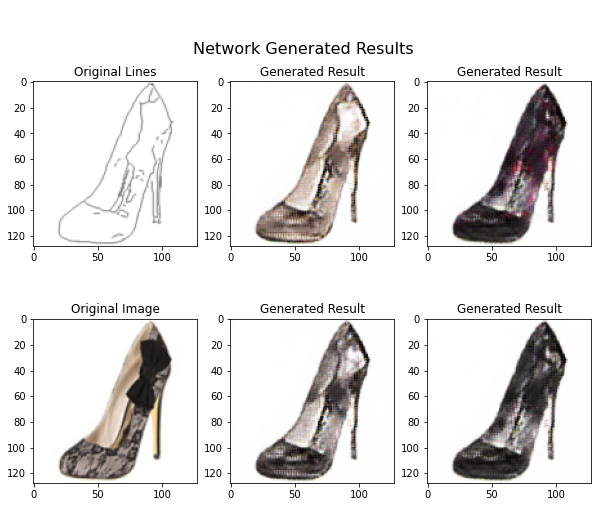

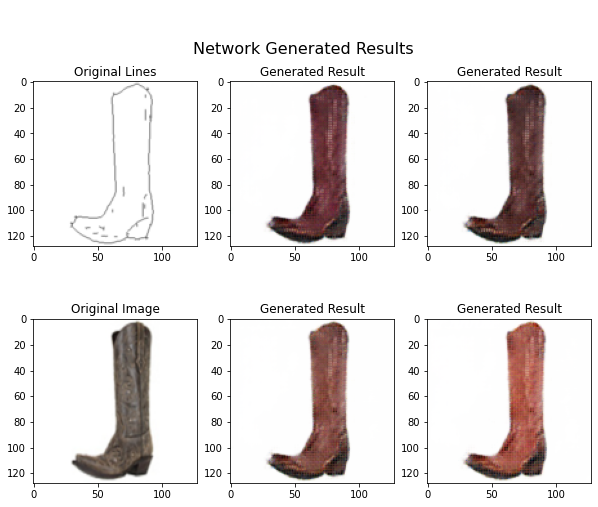

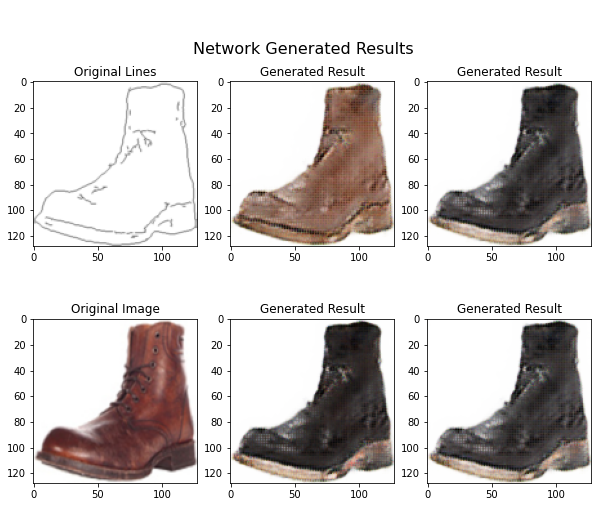

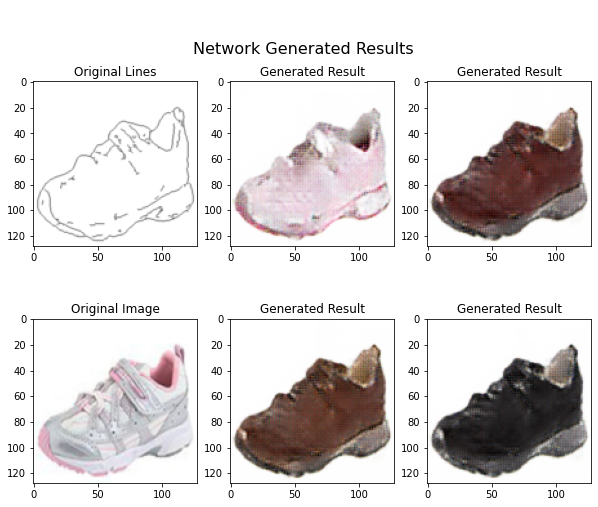

In [ ]:
num_images = 20
img_dir = 'datasets/edges2shoes/val/' 

from torch.utils import data
dataset = Edge2Shoe(img_dir)
val_loader = data.DataLoader(dataset, batch_size=32)
generator.eval()
encoder.eval()
discriminator_clr.eval()
discriminator_vae.eval()
image_list=np.random.choice(len(val_loader.dataset)-1, num_images, replace=False)


for i in range(num_images):
  outline, orig_image = val_loader.dataset[image_list[i]]


  f = plt.figure(figsize=(10,8))#, linewidth=5, edgecolor="black")

  f.tight_layout(h_pad=30)

  orig_drawn = torch.squeeze(outline,0)
  orig_drawn = np.moveaxis(orig_drawn.detach().to("cpu").numpy(),[0],[2])
  orig_drawn = orig_drawn / np.max(orig_drawn)

  ax1 =plt.subplot(2,3,1)
  ax1.set_title("Original Lines")

  plt.imshow(orig_drawn)

  orig_drawn = torch.squeeze(orig_image,0)
  orig_drawn = np.moveaxis(orig_drawn.detach().to("cpu").numpy(),[0],[2])
  orig_drawn = orig_drawn / np.max(orig_drawn)
  ax2 =plt.subplot(2,3,4)

  ax2.set_title("Original Image")
  plt.imshow(orig_drawn)

  f.suptitle("\n\nNetwork Generated Results", fontsize=16,y=0.98)

  index_vals=[2,3,5,6]
  for i in range(4):

    test0=outline - torch.min(outline)
    test = (test0) / torch.max(test0) * 2 -1
    if i==0:
      mu_real, logvar_real = encoder(torch.unsqueeze(test,0).to('cuda')) 
      z_real = reparameterization(mu_real, logvar_real)
    else:
      z_real = torch.rand([1,8]) * 2 - 1

    
    fake_images = generator(torch.unsqueeze(test,0).to('cuda'),z_real.to('cuda'))

    
    fake_im_norm = np.moveaxis(fake_images[0].detach().to("cpu").numpy(),[0],[2])

    fake_im_norm = fake_im_norm - np.min(fake_im_norm)
    fake_im_norm = fake_im_norm / np.max(fake_im_norm)
    ax =plt.subplot(2,3,index_vals[i])

    ax.set_title("Generated Result")
    plt.imshow(fake_im_norm)
    
  plt.show()

#LPIPS

In [ ]:
pip install lpips

     |████████████████████████████████| 53 kB 2.2 MB/s 


In [ ]:
from torch.utils import data
import lpips

loss_fn = lpips.LPIPS(net='alex')
lpips_scores_list=[]

img_dir = 'datasets/edges2shoes/val/' 
dataset = Edge2Shoe(img_dir)
val_loader = data.DataLoader(dataset, batch_size=32)
lpips_10=np.zeros(10)
for i in range(len(dataset)):
  
  outline, im1 = val_loader.dataset[i]
  im1 = (im1 / 128) - 1
  im1 = torch.unsqueeze(im1, 0)

  for i in range(10):
    z_real = torch.rand([1,8]) * 2 - 1
    fake_images = generator(norm(torch.unsqueeze(outline,0).to('cuda')),z_real.to('cuda'))
    #fake_images_norm = (fake_images / 128) - 1

    d = loss_fn.forward(fake_images.to('cpu'),im1.to('cpu'))
    lpips_10[i] = d.item()

  lpips_scores_list.append(np.average(lpips_10))


lpips_scores_list = np.array(lpips_scores_list)
print("\n\n\nAverage LPIPS Score for Validation=",np.average(lpips_scores_list))

#plt.figure()
#plt.plot(lpips_scores_list)

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.7/dist-packages/lpips/weights/v0.1/alex.pth



Average LPIPS Score for Validation= 0.21211828256957233


#FID Score

In [ ]:
! pip install pytorch-fid

  Created wheel for pytorch-fid: filename=pytorch_fid-0.2.1-py3-none-any.whl size=14835 sha256=8f940ec421d3efda254678b3a4381eeec7cf6e06f1aa31a7a83810262fffba36
  Stored in directory: /root/.cache/pip/wheels/24/ac/03/c5634775c8a64f702343ef5923278f8d3bb8c651debc4a6890
Successfully built pytorch-fid


In [ ]:
! mkdir models/BGANS_Edge2Shoe_2disc_2patch/real_B_1 models/BGANS_Edge2Shoe_2disc_2patch/real_B_2 models/BGANS_Edge2Shoe_2disc_2patch/gen_B

In [ ]:
# First create test data loader
from torch.utils.data import DataLoader, TensorDataset
from torchvision.utils import save_image
test_batch_size = 1
test_img_dir = 'datasets/edges2shoes/val/'
test_dataset = Edge2Shoe(test_img_dir)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size)

# indicate the device we will use
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# the size of dataset, we want to evaluate on
evaluate_num = 100

# make the gen data set and folder
real_A_set_1 = []
real_A_set_2 = []
real_B_set_1 = []
real_B_set_2 = []

gen_set_A = []
gen_set_B = []

for idx, data in enumerate(test_loader, 0):
    real_A, real_B = data

    real_A, real_B = norm(real_A).to(device), norm(real_B).to(device)
    
    if idx < evaluate_num:
        mu_real, logvar_real = encoder(real_A) 
        z_real = reparameterization(mu_real, logvar_real)
        fake_B = generator(real_A, z_real)
        
        #Normalize Images
        # fake_B = fake_B - torch.min(fake_B) 
        # fake_B = fake_B / torch.max(fake_B)
        
        real_B_set_1.append(denorm(real_B.detach()))
        gen_set_B.append(denorm(fake_B.detach()))
        
        plt.imsave('models/BGANS_Edge2Shoe_2disc_2patch/real_B_1/real_B' + str(idx) + '.png', denorm(real_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('models/BGANS_Edge2Shoe_2disc_2patch/gen_B/gen_B' + str(idx) + '.png', denorm(fake_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
      
    elif evaluate_num <= idx < 2*evaluate_num:
        real_B_set_2.append(real_B.detach())
        plt.imsave('models/BGANS_Edge2Shoe_2disc_2patch/real_B_2/real_B' + str(idx) + '.png', denorm(real_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
    
    if idx == 2*evaluate_num-1:
        break


real_B_dataset_1 = TensorDataset(torch.cat(real_B_set_1))
real_B_dataset_2 = TensorDataset(torch.cat(real_B_set_2))
gen_dataset_B = TensorDataset(torch.cat(gen_set_B))


In [ ]:
print('computing FID score between real_images_1 and real_images_2')
! python -m pytorch_fid 'models/BGANS_Edge2Shoe_2disc_2patch/real_B_1' 'models/BGANS_Edge2Shoe_2disc_2patch/real_B_2' 

print('computing FID score between real_images_1 and gen_images')
! python -m pytorch_fid 'models/BGANS_Edge2Shoe_2disc_2patch/real_B_1' 'models/BGANS_Edge2Shoe_2disc_2patch/gen_B' 

print('computing FID score between real_images_2 and gen_images')
! python -m pytorch_fid 'models/BGANS_Edge2Shoe_2disc_2patch/real_B_2' 'models/BGANS_Edge2Shoe_2disc_2patch/gen_B' 

computing FID score between real_images_1 and real_images_2
100% 2/2 [00:00<00:00,  3.32it/s]
100% 2/2 [00:00<00:00,  3.48it/s]
FID:  58.972948920857306
computing FID score between real_images_1 and gen_images
100% 2/2 [00:00<00:00,  3.12it/s]
100% 2/2 [00:00<00:00,  3.50it/s]
FID:  175.44298121702982
computing FID score between real_images_2 and gen_images
100% 2/2 [00:00<00:00,  3.42it/s]
100% 2/2 [00:00<00:00,  3.53it/s]
FID:  174.9141157958961


In [ ]:
import matplotlib.pyplot as plt
plt.figure()
plt.plot(np.array(generator_loss_list).flatten(), label='Generator')
plt.plot(np.array(encoder_loss_list).flatten(), label='Encoder')
plt.plot(np.array(vaegan_loss_list).flatten(), label='cVAE-GAN Discriminator')
plt.plot(np.array(clrgan_loss_list).flatten(), label='cLR-Gan Discriminator')
plt.title('Generator and Discriminator Loss plots')
plt.xlabel('Steps')
plt.ylabel('Loss/report_feq')
plt.legend()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
plt.figure()

plt.plot(np.array(encoder_loss_list).flatten(), label='Encoder')
plt.title('Encoder Loss plots')
plt.xlabel('Steps')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
mu_real, logvar_real = encoder(input_image) 
z_real = reparameterization(mu_real, logvar_real)
fake_images = generator (input_image,z_real)

plt.figure()
fake_im = np.moveaxis(fake_images[0].detach().to("cpu").numpy(),[0],[2])
fake_im = fake_im / np.max(fake_im)
plt.imshow(fake_im)

In [ ]:
#vis_tools.py

import cv2
import numpy as np
import pdb
import plotly
from plotly.tools import mpl_to_plotly
from matplotlib import pyplot as plt
plt.switch_backend('agg')

class visualizer(object):

	def __init__(self, port = 8000, scatter_size=[[-1, 1], [-1, 1]]):
		import visdom
		self.vis = visdom.Visdom(port=port)
		(self.x_min, self.x_max), (self.y_min, self.y_max) = scatter_size
		self.counter = 0

	def img_result(self, img_list, caption = 'view', win = 1):
		self.vis.images(img_list,nrow = len(img_list), win = win, opts={'caption':caption})
	
	def plot_img_255(self, img, caption='view', win = 1):
		self.vis.image(img, win = win, opts={'caption': caption})

	# Occupies window 0
	def plot_error(self, errors, win = 0, id_val = 1):
		if not hasattr(self, 'plot_data'):
			self.plot_data = [{'X': [], 'Y': [], 'legend': list(errors.keys())}]
		elif len(self.plot_data) != id_val:
			self.plot_data.append({'X': [], 'Y': [], 'legend': list(errors.keys())})
		id_val -= 1
		self.plot_data[id_val]['X'].append(self.counter)
		self.plot_data[id_val]['Y'].append([errors[k]
									for k in self.plot_data[id_val]['legend']])
		self.vis.line(
			X=np.stack([np.array(self.plot_data[id_val]['X'])]*len(self.plot_data[id_val]['legend']), 1),
			Y=np.array(self.plot_data[id_val]['Y']),
			opts={
				'legend': self.plot_data[id_val]['legend'],
				'xlabel': 'epoch',
				'ylabel': 'loss'}, win = win)
		self.counter += 1

	def plot_quiver_img(self, img, flow, win = 0, caption = 'view'):
		fig, ax = plt.subplots(1)
		ax.axis('off')
		ax.imshow(img.transpose(1,2,0))
		X, Y, U, V = flow_to_XYUV(flow)
		ax.quiver(X, Y, U, V, angles='xy', color='y')
		plotly_fig = mpl_to_plotly(fig)
		self.vis.plotlyplot(plotly_fig)
		plt.clf()
